# Anticipez les besoins en consommation de bâtiments - Ville de SEATTLE
# Analyse exploratoire 

# <a name="C0">SOMMAIRE</a>
### <a href="#C1">1. Set up Environnement</a>
### <a href="#C2">2. Nettoyage</a>
- <a href="#C21">2.1 Bâtiments non déstinés à l'habitation</a>
- <a href="#C22">2.2 Sélection des variables</a>
- <a href="#C23">2.3 Nettoyage des valeurs</a>
- <a href="#C24">2.4 Catégoriser, Simplifier</a>

### <a href="#C3">3. Analyses Exploratoires</a>

### <a href="#C4">4. Feature Engineering</a>


### Données et Source :
https://s3.eu-west-1.amazonaws.com/course.oc-static.com/projects/Data_Scientist_P4/2016_Building_Energy_Benchmarking.csv
https://data.seattle.gov/dataset/2016-Building-Energy-Benchmarking/2bpz-gwpy


### Ce qu'il faut faire :

#### 1) analyse exploratoire 
mise au propre et annotée (+ nettoyage ?)
#### 2) prédiction émission CO2
différents tests de modèles mis au propre, dans lequel vous identifierez clairement le modèle final choisi. 
Vous cherchez également à évaluer l’intérêt de l’"ENERGY STAR Score" pour la prédiction d’émissions, qui est fastidieux à calculer avec l’approche utilisée actuellement par votre équipe. Vous l'intégrerez dans la modélisation et jugerez de son intérêt.
https://www.energystar.gov/buildings/facility-owners-and-managers/existing-buildings/use-portfolio-manager/interpret-your-results/what

#### 3) prédiction consommation totale
différents tests de modèles mis au propre, dans lequel vous identifierez clairement le modèle final choisi.

### IMPORTANT : mail 
 : L’objectif est de te passer des relevés de consommation annuels futurs (attention à la fuite de données). Nous ferons de toute façon pour tout nouveau bâtiment un premier relevé de référence la première année, donc rien ne t'interdit d’en déduire des variables structurelles aux bâtiments, par exemple la nature et proportions des sources d’énergie utilisées.. 

Fais bien attention au traitement des différentes variables, à la fois pour trouver de nouvelles informations (peut-on déduire des choses intéressantes d’une simple adresse ?) et optimiser les performances en appliquant des transformations simples aux variables (normalisation, passage au log, etc.).

Mets en place une évaluation rigoureuse des performances de la régression, et optimise les hyperparamètres et le choix d’algorithmes de ML à l’aide d’une validation croisée.
    

# Notes

##### SITE Energy USE car même si source intéressant nous n'avons pas le total.

#####  Weather normalized energy 
Weather normalized energy is the energy your building would have used under average conditions (also referred to as climate normals). The weather in a given year may be much hotter or colder than your building's normal climate; weather normalized energy accounts for this difference

##### Les données datent de 2016

### VAR A PREDIRE  'TotalGHGEmissions' et 'SiteEnergyUse(kBtu) '.


# <a name="C1">1. Set up environnement</a>
<a href="#C0">SOMMAIRE</a>

In [1]:
#Import des librairies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from numpy import isnan
import scipy.stats
%matplotlib inline

#Réglages d'affichage
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_colwidth', 2000)

# Rappel du thème utilisé
sns.set_style('darkgrid')
sns.set_palette('Set2')

In [2]:
#Import des données
data = pd.read_csv('https://s3.eu-west-1.amazonaws.com/course.oc-static.com/projects/Data_Scientist_P4/2016_Building_Energy_Benchmarking.csv')

In [3]:
#fonction eta carré qui donne la corélation entre une variable qualitative x et une variable quantitative y
def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT


In [4]:
def anova_boxplot(data, X, Y):
    # Récupérer les modalités de X
    modalites = data[X].unique()
    
    # Créer les groupes pour chaque modalité de X
    groupes = []
    for m in modalites:
        groupes.append(data[data[X] == m][Y])
    
    # Propriétés graphiques (pas très importantes)
    medianprops = {'color': 'black'}
    meanprops = {'marker': 'o', 'markeredgecolor': 'black',
                 'markerfacecolor': 'firebrick'}
    
    # Créer le boxplot
    plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops,
                vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
    
    # Ajouter un titre et des étiquettes d'axes
    plt.title(f"{Y} en fonction de {X}")
    plt.xlabel(Y)
    plt.ylabel(X)
    
    # Afficher le graphique
    plt.show()


In [5]:
#fonction pour faire régression linéaire et tester le modèle
import statsmodels.api as sm
import pandas as pd
import numpy as np
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

def regression_lineaire(data,X_colname,Y_colname):
    X = data[[X_colname]].copy()
    Y = data[Y_colname]
    X['intercept'] = 1.
    result = sm.OLS(Y,X).fit()
    c,d = result.params[X_colname],result.params['intercept']
    print(f"Droite de régression {Y_colname} en fonction de {X_colname}")
    print(f"y = {c}x + {d}")
    # Affichage de la droite de régression
    plt.plot(X[X_colname],Y,"o")
    plt.plot(np.arange(X[X_colname].min(), X[X_colname].max()+1),[c*x+d for x in np.arange(X[X_colname].min(), X[X_colname].max()+1)])
    plt.xlabel(X_colname)
    plt.ylabel(Y_colname)
    plt.show()
    # Calcul du score R2
    actual_values = Y
    predicted_values = X.apply(lambda row: c*row[X_colname] + d, axis=1)
    r2 = r2_score(actual_values, predicted_values)
    print(f"Score R2 pour le modèle : {r2}")


In [6]:
def heatmap_analysis(x_col, y_col, data):
    """
    Perform a qualitative analysis and visualize the results using a heatmap.
    
    Parameters:
    data (pandas.DataFrame): the input data
    x_col (str): the name of the first categorical variable
    y_col (str): the name of the second categorical variable
    
    Returns:
    None
    """
    
    # Compute the contingency table
    table = pd.crosstab(data[x_col], data[y_col])
    
    # Compute the Pearson's correlation coefficient
    chi2, p, dof, expected = scipy.stats.chi2_contingency(table)
    n = table.sum().sum()
    phi_c = np.sqrt(chi2 / (n*(min(table.shape)-1)))
    
    # Print the test statistics
    print(f"Chi-square: {chi2:.2f}")
    print(f"P-value: {p:.2f}")
    print(f"Cramer's V: {phi_c:.2f}")
    
    # Plot the heatmap
    ax = sns.heatmap(table, cmap="coolwarm", vmin=0, vmax=1, annot=True, fmt=".0f")
    ax.set_xlabel(x_col)
    ax.set_ylabel(y_col)
    ax.set_title(f"Heatmap of {x_col} vs. {y_col}")
    
    # Show the plot
    plt.show()


In [7]:
data.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,2003882.00,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.00,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,72587024.0,73937112.0,21566554.00,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6794584.0,6946800.5,2214446.25,8.115253e+05,2768924.0,18112.13086,1811213.0,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,14172606.0,14656503.0,0.00,1.573449e+06,5368607.0,88039.98438,8803998.0,False,NaN,Compliant,NaN,505.01,2.88


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3376 non-null   int64  
 1   DataYear                         3376 non-null   int64  
 2   BuildingType                     3376 non-null   object 
 3   PrimaryPropertyType              3376 non-null   object 
 4   PropertyName                     3376 non-null   object 
 5   Address                          3376 non-null   object 
 6   City                             3376 non-null   object 
 7   State                            3376 non-null   object 
 8   ZipCode                          3360 non-null   float64
 9   TaxParcelIdentificationNumber    3376 non-null   object 
 10  CouncilDistrictCode              3376 non-null   int64  
 11  Neighborhood                     3376 non-null   object 
 12  Latitude            

In [9]:
#taux de remplissage des colonnes
round(100-(data.isnull().sum()/len(data)*100),2)

OSEBuildingID                      100.00
DataYear                           100.00
BuildingType                       100.00
PrimaryPropertyType                100.00
PropertyName                       100.00
Address                            100.00
City                               100.00
State                              100.00
ZipCode                             99.53
TaxParcelIdentificationNumber      100.00
CouncilDistrictCode                100.00
Neighborhood                       100.00
Latitude                           100.00
Longitude                          100.00
YearBuilt                          100.00
NumberofBuildings                   99.76
NumberofFloors                     100.00
PropertyGFATotal                   100.00
PropertyGFAParking                 100.00
PropertyGFABuilding(s)             100.00
ListOfAllPropertyUseTypes           99.73
LargestPropertyUseType              99.41
LargestPropertyUseTypeGFA           99.41
SecondLargestPropertyUseType      


# <a name="C2">2. Nettoyage</a>
<a href="#C0">SOMMAIRE</a>

## <a name="C21">2.1 Bâtiments non déstinés à l'habitation</a>

In [10]:
data.BuildingType.unique()

array(['NonResidential', 'Nonresidential COS', 'Multifamily MR (5-9)',
       'SPS-District K-12', 'Campus', 'Multifamily LR (1-4)',
       'Multifamily HR (10+)', 'Nonresidential WA'], dtype=object)

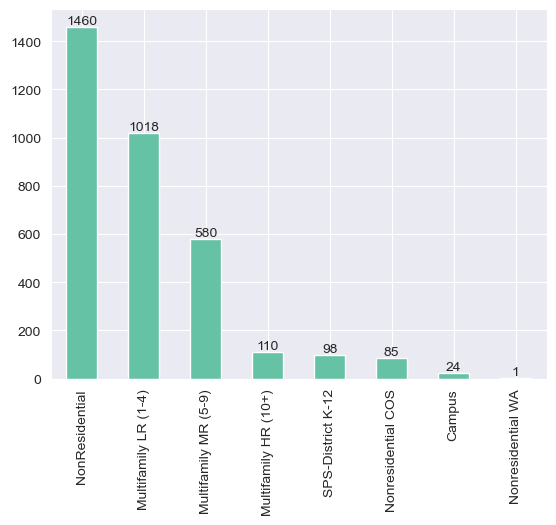

In [11]:
# Diagramme en tuyaux d'orgues
bx=data.BuildingType.value_counts(normalize=False).plot(kind='bar')
bx.bar_label(bx.containers[0])
bx.set_xticklabels(bx.get_xticklabels(), rotation=90)
plt.show()

Nous devons faire une analyse sur les bâtiments **non destinés à l'habitation** 
- Nonresidential c'est ok
- Multifamily MR, LR, HR : Middle Rise, Low Rise correspondent à des tailles de bâtiments pour FAMILLES => non résidentiels
- SPS : Seatlle Public School ==> OK
- campus ? résidences étudiantes ? on verra dans le Primary Property Type

In [12]:
data = data[~data.BuildingType.str.contains("Multifamily")]
print(data.BuildingType.unique())
data.shape

['NonResidential' 'Nonresidential COS' 'SPS-District K-12' 'Campus'
 'Nonresidential WA']


(1668, 46)

In [13]:
data.reset_index(drop=True,inplace=True)
data.PrimaryPropertyType.unique()

array(['Hotel', 'Other', 'Mixed Use Property', 'K-12 School',
       'University', 'Small- and Mid-Sized Office',
       'Self-Storage Facility', 'Warehouse', 'Large Office',
       'Senior Care Community', 'Medical Office', 'Retail Store',
       'Hospital', 'Residence Hall', 'Distribution Center',
       'Worship Facility', 'Supermarket / Grocery Store', 'Laboratory',
       'Refrigerated Warehouse', 'Restaurant', 'Low-Rise Multifamily',
       'Office'], dtype=object)

In [14]:
#affichage des erreurs de type de bâtiment, il reste des multifamily
data[data.PrimaryPropertyType=='Low-Rise Multifamily']

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
632,19445,2016,NonResidential,Low-Rise Multifamily,Pacific Pointe,2108 N Pacific St.,Seattle,WA,98103.0,0354000254,4,LAKE UNION,47.64859,-122.33311,2000,1.0,3,93079,36093,56986,Multifamily Housing,Multifamily Housing,91064.0,NaN,NaN,NaN,NaN,NaN,32.0,21.900000,23.000000,63.099998,65.099998,1.997182e+06,2090011.625,0.0,5.111956e+05,1744199.0,2529.819824,252982.0,False,NaN,Compliant,NaN,25.60,0.28
912,21481,2016,Campus,Low-Rise Multifamily,Sanitary Market,1525 FIrst Avenue,Seattle,WA,98101.0,1976200210,7,DOWNTOWN,47.60918,-122.34079,1942,1.0,4,45500,0,45500,"Bar/Nightclub, Food Sales, Multifamily Housing, Restaurant, Retail Store, Self-Storage Facility",Multifamily Housing,22669.0,Retail Store,10455.0,Restaurant,3668.0,NaN,NaN,85.199997,85.199997,267.500000,267.500000,3.778355e+06,3778355.000,0.0,1.107372e+06,3778355.0,0.000000,0.0,False,NaN,Compliant,NaN,26.34,0.58
1365,25674,2016,NonResidential,Low-Rise Multifamily,(ID25674) COMET TAVERN,916 E PIKE ST,Seattle,WA,98122.0,6003500480,3,EAST,47.61427,-122.31977,1910,1.0,3,32100,0,32100,"Bar/Nightclub, Multifamily Housing",Multifamily Housing,21400.0,Bar/Nightclub,10700.0,NaN,NaN,NaN,NaN,3.400000,4.500000,4.300000,5.400000,1.082004e+05,142892.500,0.0,3.332500e+03,11370.0,968.300171,96830.0,False,NaN,Non-Compliant,Low outlier,5.22,0.16


In [15]:
#modification des erreurs trouvées ci-dessus
data.loc[data.OSEBuildingID == 25674, ['PrimaryPropertyType']]='Restaurant'
data = data.drop(data[data.OSEBuildingID.isin([19445,21481])].index)
data.shape

(1666, 46)

## <a name="C22">2.2 Sélection des variables</a>

Toutes les variabels ne nous intéressent pas et certaines sont redondantes. Nous allons donc sélectionner les plus pertinentes.

In [16]:
for col in data.columns :
    print('VALEURS dans ',col)
    print('nombre de valeurs : ',len(data[col].unique()))
    print(data[col].unique(),'\n\n')

VALEURS dans  OSEBuildingID
nombre de valeurs :  1666
[    1     2     3 ... 50224 50225 50226] 


VALEURS dans  DataYear
nombre de valeurs :  1
[2016] 


VALEURS dans  BuildingType
nombre de valeurs :  5
['NonResidential' 'Nonresidential COS' 'SPS-District K-12' 'Campus'
 'Nonresidential WA'] 


VALEURS dans  PrimaryPropertyType
nombre de valeurs :  21
['Hotel' 'Other' 'Mixed Use Property' 'K-12 School' 'University'
 'Small- and Mid-Sized Office' 'Self-Storage Facility' 'Warehouse'
 'Large Office' 'Senior Care Community' 'Medical Office' 'Retail Store'
 'Hospital' 'Residence Hall' 'Distribution Center' 'Worship Facility'
 'Supermarket / Grocery Store' 'Laboratory' 'Refrigerated Warehouse'
 'Restaurant' 'Office'] 


VALEURS dans  PropertyName
nombre de valeurs :  1662
['Mayflower park hotel' 'Paramount Hotel' '5673-The Westin Seattle' ...
 'Queen Anne Pool' 'South Park Community Center'
 'Van Asselt Community Center'] 


VALEURS dans  Address
nombre de valeurs :  1645
['405 Olive way' 

J'enlève les variables qui n'ont qu'un seule valeur comme par exemple datayear, city state... 
J'enlève également celles qui ne donnt pas d'info supplémentaire comme ZipCode (j'ai déja les quartiers par exemple), ou bien le taxParcelIDentification car j'ai déjà l'ID des bâtiments.
Certaines valeurs sont exprimées avec plusieurs unités, celle la plus commune est KbtU donc je garde uniquement celle-ci.

##### Questions : Dois je garder Weather Normalised ?
SiteEUIWN(kBtu/sf)
SourceEUIWN(kBtu/sf)
==> Nous n'avons pas de données sur les différentes années, il ne s'agit pas de séries temporelles. Ces valeurs nous permettraient donc seulement de voir à quel point la météo impacte la consommation des bâtiments. Je ne suis pas sûre de l'utilité de cet indicateur mais je le garde pour le moment.

##### Dois-je garder Outlier ? Qu'est ce qu'il y a dedans ?
je vais les garder pour potentiellement pouvoir filter et enlever les outliers lors de l'apprentissage de mon jeu de données



In [17]:
print('nb de High Outlier : ',len(data[data.Outlier=='High outlier']))
print('nb de Low Outlier : ',len(data[data.Outlier=='Low outlier']))

nb de High Outlier :  2
nb de Low Outlier :  15


In [18]:
todrop=['DataYear','City','State','ZipCode','TaxParcelIdentificationNumber','YearsENERGYSTARCertified',
        'Electricity(kWh)','NaturalGas(therms)','DefaultData','ComplianceStatus','Comments']
data.shape

(1666, 46)

In [19]:
data.drop(columns=todrop,inplace=True)
data.shape

(1666, 35)

## <a name="C23">2.3 Nettoyage des valeurs</a>
### Duplicates

In [20]:
#check for duplicates
data[data.duplicated(subset='OSEBuildingID',keep=False)]

,OSEBuildingID,BuildingType,PrimaryPropertyType,PropertyName,Address,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),Outlier,TotalGHGEmissions,GHGEmissionsIntensity


### Neighborhood uniformisation

In [21]:
data.Neighborhood.unique()

array(['DOWNTOWN', 'SOUTHEAST', 'NORTHEAST', 'EAST', 'Central', 'NORTH',
       'MAGNOLIA / QUEEN ANNE', 'LAKE UNION', 'GREATER DUWAMISH',
       'BALLARD', 'NORTHWEST', 'CENTRAL', 'SOUTHWEST', 'DELRIDGE',
       'Ballard', 'North', 'Delridge', 'Northwest',
       'DELRIDGE NEIGHBORHOODS'], dtype=object)

In [22]:
data.Neighborhood = data.Neighborhood.str.upper()
data.Neighborhood.replace('DELRIDGE NEIGHBORHOODS', 'DELRIDGE', inplace=True)
data.Neighborhood.unique()

array(['DOWNTOWN', 'SOUTHEAST', 'NORTHEAST', 'EAST', 'CENTRAL', 'NORTH',
       'MAGNOLIA / QUEEN ANNE', 'LAKE UNION', 'GREATER DUWAMISH',
       'BALLARD', 'NORTHWEST', 'SOUTHWEST', 'DELRIDGE'], dtype=object)

### Valeurs aberrantes

#### valeurs négatives

In [23]:
data.min(numeric_only=True)

OSEBuildingID                           1.00000
CouncilDistrictCode                     1.00000
Latitude                               47.49917
Longitude                            -122.41182
YearBuilt                            1900.00000
NumberofBuildings                       0.00000
NumberofFloors                          0.00000
PropertyGFATotal                    11285.00000
PropertyGFAParking                      0.00000
PropertyGFABuilding(s)               3636.00000
LargestPropertyUseTypeGFA            5656.00000
SecondLargestPropertyUseTypeGFA         0.00000
ThirdLargestPropertyUseTypeGFA          0.00000
ENERGYSTARScore                         1.00000
SiteEUI(kBtu/sf)                        0.00000
SiteEUIWN(kBtu/sf)                      0.00000
SourceEUI(kBtu/sf)                      0.00000
SourceEUIWN(kBtu/sf)                   -2.10000
SiteEnergyUse(kBtu)                     0.00000
SiteEnergyUseWN(kBtu)                   0.00000
SteamUse(kBtu)                          

In [24]:
#identification des valeurs négatives
negativevars=['TotalGHGEmissions','Electricity(kBtu)','SourceEUIWN(kBtu/sf)','GHGEmissionsIntensity']
indextodrop=[]
for var in negativevars :
    indextodrop.extend(data[data[var]<0].index)
    indextodrop = list(set(indextodrop))
indextodrop

[1605]

In [25]:
data.drop(index=indextodrop,inplace=True)
data.shape

(1665, 35)

#### Valeurs nulles
Nb de builinds et nombre d'étages ne peuvent être nuls ou non renseignés donc nous allons tous les mettre à 1

In [26]:
print('NumberofBuildingsof ',data.NumberofBuildings.unique())
print('NumberofBuildingsof ',data.NumberofBuildings.unique())

NumberofBuildingsof  [  1.   3.   0.   2.   4.  27.   6.  11.  14.   9.   5.  nan   7.   8.
  23.  10. 111.]
NumberofBuildingsof  [  1.   3.   0.   2.   4.  27.   6.  11.  14.   9.   5.  nan   7.   8.
  23.  10. 111.]


In [27]:
nullvars=['NumberofBuildings','NumberofFloors']
for var in nullvars :
    print(var,' ',np.sort(data[var].unique()))
    data[var].fillna(0, inplace=True)
    data[var].replace(0,1,inplace=True)
    print(var,' ',np.sort(data[var].unique()))

NumberofBuildings   [  0.   1.   2.   3.   4.   5.   6.   7.   8.   9.  10.  11.  14.  23.
  27. 111.  nan]
NumberofBuildings   [  1.   2.   3.   4.   5.   6.   7.   8.   9.  10.  11.  14.  23.  27.
 111.]
NumberofFloors   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 27 28 29 30 33 34 36 37 39 41 42 46 47 49 55 56 63 76 99]
NumberofFloors   [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 27 28 29 30 33 34 36 37 39 41 42 46 47 49 55 56 63 76 99]


### Valeurs manquantes

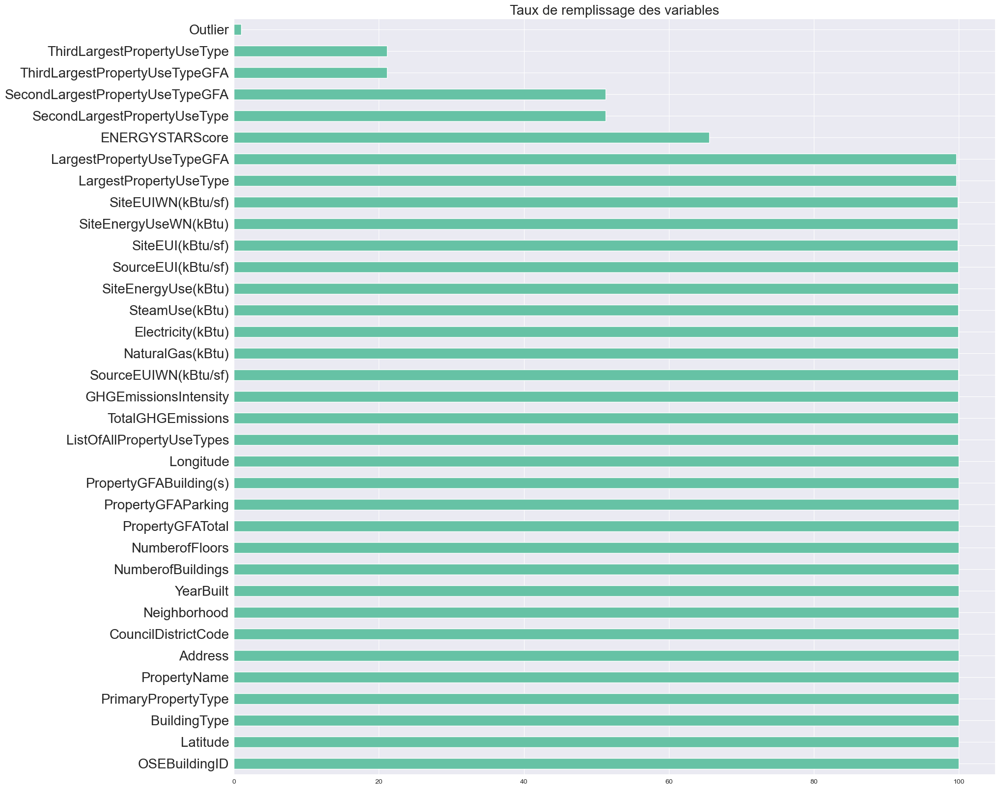

In [28]:
txremplissage = round(100-(data.isnull().sum()/len(data)*100),2)
txremplissage.sort_values(ascending=True,inplace=True)
plt.figure(figsize=(20,20))
plt.title('Taux de remplissage des variables',fontsize=20)
plt.yticks(fontsize=20)
txremplissage.sort_values(ascending=False).plot(kind='barh')
plt.show()

In [29]:
txremplissage

Outlier                              1.02
ThirdLargestPropertyUseType         21.14
ThirdLargestPropertyUseTypeGFA      21.14
SecondLargestPropertyUseTypeGFA     51.29
SecondLargestPropertyUseType        51.29
ENERGYSTARScore                     65.59
LargestPropertyUseTypeGFA           99.64
LargestPropertyUseType              99.64
SiteEUIWN(kBtu/sf)                  99.82
SiteEUI(kBtu/sf)                    99.82
SiteEnergyUseWN(kBtu)               99.82
SiteEnergyUse(kBtu)                 99.88
SteamUse(kBtu)                      99.88
Electricity(kBtu)                   99.88
NaturalGas(kBtu)                    99.88
SourceEUIWN(kBtu/sf)                99.88
SourceEUI(kBtu/sf)                  99.88
GHGEmissionsIntensity               99.88
ListOfAllPropertyUseTypes           99.88
TotalGHGEmissions                   99.88
BuildingType                       100.00
PrimaryPropertyType                100.00
PropertyName                       100.00
Address                           

In [30]:
#Je remplace les NaN de ThirdLargestPropertyUseTypeGFA et SecondLargestPropertyUseTypeGFA par zéro etc
varsnantozero = ['ThirdLargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA',
                   'LargestPropertyUseTypeGFA','SteamUse(kBtu)',
                   'Electricity(kBtu)','NaturalGas(kBtu)']
data[varsnantozero]=data[varsnantozero].fillna(0)

In [31]:
#je mets unknown quand caté pas renseignée
varsnantounknown = ['ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
                   'SecondLargestPropertyUseType','ThirdLargestPropertyUseType',
                   'ENERGYSTARScore']
data[varsnantounknown]=data[varsnantounknown].fillna('unknown')

In [32]:
rowswithnan = data[data.drop(columns='Outlier',inplace=False).isnull().any(axis=1)]
rowswithnan

,OSEBuildingID,BuildingType,PrimaryPropertyType,PropertyName,Address,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),Outlier,TotalGHGEmissions,GHGEmissionsIntensity
298,435,NonResidential,Other,Washington State Convention Center,705 Pike St,7,DOWNTOWN,47.61195,-122.33167,1990,1.0,6,1400000,0,1400000,"Convention Center, Parking",Convention Center,1072000.0,Parking,686750.0,unknown,0.0,unknown,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.00,0.00
553,757,NonResidential,Large Office,Market Place I & II-2003 Western Avenue,2003 Western Avenue,7,DOWNTOWN,47.61051,-122.34439,1979,1.0,7,131143,87160,43983,"Office, Retail Store",Office,120248.0,Retail Store,10853.0,unknown,0.0,93.0,39.5,NaN,128.0,0.0,5177270.5,NaN,0.0,4871126.0,1416041.0,NaN,109.16,0.83
568,773,NonResidential,Small- and Mid-Sized Office,SEATTLE BUILDING,215 COLUMBIA ST,7,DOWNTOWN,47.60380,-122.33293,1924,1.0,4,63150,0,63150,unknown,unknown,0.0,unknown,0.0,unknown,0.0,unknown,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN
1423,26532,NonResidential,Mixed Use Property,KALBERG BUILDING,4515 UNIVERSITY WAY NE,4,NORTHEAST,47.66182,-122.31345,1928,1.0,2,20760,0,20760,unknown,unknown,0.0,unknown,0.0,unknown,0.0,unknown,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN


In [33]:
data.drop(index=rowswithnan.index,inplace=True)
data.shape

(1661, 35)

In [34]:
data.Outlier=data.Outlier.fillna('no')

In [35]:
round(100-(data.isnull().sum()/len(data)*100),2)

OSEBuildingID                      100.0
BuildingType                       100.0
PrimaryPropertyType                100.0
PropertyName                       100.0
Address                            100.0
CouncilDistrictCode                100.0
Neighborhood                       100.0
Latitude                           100.0
Longitude                          100.0
YearBuilt                          100.0
NumberofBuildings                  100.0
NumberofFloors                     100.0
PropertyGFATotal                   100.0
PropertyGFAParking                 100.0
PropertyGFABuilding(s)             100.0
ListOfAllPropertyUseTypes          100.0
LargestPropertyUseType             100.0
LargestPropertyUseTypeGFA          100.0
SecondLargestPropertyUseType       100.0
SecondLargestPropertyUseTypeGFA    100.0
ThirdLargestPropertyUseType        100.0
ThirdLargestPropertyUseTypeGFA     100.0
ENERGYSTARScore                    100.0
SiteEUI(kBtu/sf)                   100.0
SiteEUIWN(kBtu/s

In [36]:
data

,OSEBuildingID,BuildingType,PrimaryPropertyType,PropertyName,Address,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,NonResidential,Hotel,Mayflower park hotel,405 Olive way,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,unknown,0.0,unknown,0.0,60.0,81.699997,84.300003,182.500000,189.000000,7.226362e+06,7.456910e+06,2003882.00,3.946027e+06,1.276453e+06,no,249.98,2.83
1,2,NonResidential,Hotel,Paramount Hotel,724 Pine street,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,61.0,94.800003,97.900002,176.100006,179.399994,8.387933e+06,8.664479e+06,0.00,3.242851e+06,5.145082e+06,no,295.86,2.86
2,3,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,unknown,0.0,unknown,0.0,43.0,96.000000,97.699997,241.899994,244.100006,7.258702e+07,7.393711e+07,21566554.00,4.952666e+07,1.493800e+06,no,2089.28,2.19
3,5,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,unknown,0.0,unknown,0.0,56.0,110.800003,113.300003,216.199997,224.000000,6.794584e+06,6.946800e+06,2214446.25,2.768924e+06,1.811213e+06,no,286.43,4.67
4,8,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,75.0,114.800003,118.699997,211.399994,215.600006,1.417261e+07,1.465650e+07,0.00,5.368607e+06,8.803998e+06,no,505.01,2.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1663,50222,Nonresidential COS,Office,Horticulture building,1600 S Dakota St,2,GREATER DUWAMISH,47.56722,-122.31154,1990,1.0,1,12294,0,12294,Office,Office,12294.0,unknown,0.0,unknown,0.0,46.0,69.099998,76.699997,161.699997,176.100006,8.497457e+05,9.430032e+05,0.00,5.242709e+05,3.254750e+05,no,20.94,1.70
1664,50223,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,2,DOWNTOWN,47.59625,-122.32283,2004,1.0,1,16000,0,16000,Other - Recreation,Other - Recreation,16000.0,unknown,0.0,unknown,0.0,unknown,59.400002,65.900002,114.199997,118.900002,9.502762e+05,1.053706e+06,0.00,3.965461e+05,5.537300e+05,no,32.17,2.01
1665,50224,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,7,MAGNOLIA / QUEEN ANNE,47.63644,-122.35784,1974,1.0,1,13157,0,13157,"Fitness Center/Health Club/Gym, Other - Recreation, Swimming Pool",Other - Recreation,7583.0,Fitness Center/Health Club/Gym,5574.0,Swimming Pool,0.0,unknown,438.200012,460.100006,744.799988,767.799988,5.765898e+06,6.053764e+06,0.00,1.792159e+06,3.973739e+06,no,223.54,16.99
1666,50225,Nonresidential COS,Mixed Use Property,South Park Community Center,8319 8th Ave S,1,GREATER DUWAMISH,47.52832,-122.32431,1989,1.0,1,14101,0,14101,"Fitness Center/Health Club/Gym, Food Service, Office, Other - Recreation, Pre-school/Daycare",Other - Recreation,6601.0,Fitness Center/Health Club/Gym,6501.0,Pre-school/Daycare,484.0,unknown,51.000000,55.500000,105.300003,110.800003,7.194712e+05,7.828413e+05,0.00,3.488702e+05,3.706010e+05,no,22.11,1.57


In [37]:
data.PrimaryPropertyType.unique()

array(['Hotel', 'Other', 'Mixed Use Property', 'K-12 School',
       'University', 'Small- and Mid-Sized Office',
       'Self-Storage Facility', 'Warehouse', 'Large Office',
       'Senior Care Community', 'Medical Office', 'Retail Store',
       'Hospital', 'Residence Hall', 'Distribution Center',
       'Worship Facility', 'Supermarket / Grocery Store', 'Laboratory',
       'Refrigerated Warehouse', 'Restaurant', 'Office'], dtype=object)

## <a name="C24">2.4 Catégoriser, Simplifier</a>

Il y a un grand nombre de type de propriétés différentes, il faudrait réussir à les simplifier.

In [38]:
data.select_dtypes(['object']).nunique().sort_values(ascending=False)

PropertyName                    1657
Address                         1640
ListOfAllPropertyUseTypes        370
ENERGYSTARScore                  101
LargestPropertyUseType            56
SecondLargestPropertyUseType      48
ThirdLargestPropertyUseType       40
PrimaryPropertyType               21
Neighborhood                      13
BuildingType                       5
Outlier                            3
dtype: int64

In [39]:
propertytypecol = ['LargestPropertyUseType', 'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType','PrimaryPropertyType']
listoftype = []
for col in propertytypecol:
    listoftype += data[col].dropna().unique().tolist()
listoftype = list(set(listoftype))

In [40]:
listoftype.sort()
listoftype

['Adult Education',
 'Automobile Dealership',
 'Bank Branch',
 'Bar/Nightclub',
 'College/University',
 'Convenience Store without Gas Station',
 'Courthouse',
 'Data Center',
 'Distribution Center',
 'Enclosed Mall',
 'Fast Food Restaurant',
 'Financial Office',
 'Fire Station',
 'Fitness Center/Health Club/Gym',
 'Food Sales',
 'Food Service',
 'Hospital',
 'Hospital (General Medical & Surgical)',
 'Hotel',
 'K-12 School',
 'Laboratory',
 'Large Office',
 'Library',
 'Lifestyle Center',
 'Manufacturing/Industrial Plant',
 'Medical Office',
 'Mixed Use Property',
 'Movie Theater',
 'Multifamily Housing',
 'Museum',
 'Non-Refrigerated Warehouse',
 'Office',
 'Other',
 'Other - Education',
 'Other - Entertainment/Public Assembly',
 'Other - Lodging/Residential',
 'Other - Mall',
 'Other - Public Services',
 'Other - Recreation',
 'Other - Restaurant/Bar',
 'Other - Services',
 'Other - Technology/Science',
 'Other - Utility',
 'Other/Specialty Hospital',
 'Parking',
 'Performing Arts',


In [41]:
typedict = {
    'Administrative' : ['Bank Branch', 
                        'Financial Office',
                        'Large Office',
                        'Small- and Mid-Sized Office', 
                        'Other - Services'],
    'Education' : ['Adult Education', 
                   'College/University', 
                   'K-12 School',
                   'Other - Education', 
                   'Vocational School',
                   'Library'],
    'Entertainment' : ['Bar/Nightclub',
                       'Movie Theater', 
                       'Other - Entertainment/Public Assembly', 
                       'Performing Arts', 
                       'Social/Meeting Hall'],
    'Food Service' : ['Fast Food Restaurant',
                      'Food Sales',
                      'Food Service', 
                      'Restaurant'
                      ,'Other - Restaurant/Bar'],
    'Healthcare' : ['Hospital',
                    'Hospital (General Medical & Surgical)',
                    'Medical Office', 
                    'Other/Specialty Hospital',
                    'Urgent Care/Clinic/Other Outpatient', 
                    'Senior Care Community'],
    'Hotel/Residential' : ['Hotel', 
                           'Residence Hall', 
                           'Residence Hall/Dormitory', 
                           'Residential Care Facility',
                           'Other - Lodging/Residential'],
    'Industrial/Manufacturing' : ['Manufacturing/Industrial Plant'],
    'Public Services' : ['Courthouse',
                         'Fire Station',
                         'Police Station',
                         'Other - Public Services',
                         'Worship Facility'
                         , 'Museum'],
    'Retail' : ['Automobile Dealership', 'Convenience Store without Gas Station', 'Enclosed Mall', 
                'Lifestyle Center', 'Non-Refrigerated Warehouse', 'Other - Mall', 'Retail Store', 
                'Self-Storage Facility', 'Strip Mall', 'Wholesale Club/Supercenter','Supermarket / Grocery Store',
                'Personal Services (Health/Beauty, Dry Cleaning, etc)','Repair Services (Vehicle, Shoe, Locksmith, etc)', 'Other - Services'],
    'Warehouse/Storage' : ['Data Center', 'Distribution Center', 'Refrigerated Warehouse', 'Warehouse'],
}


In [42]:
from collections import defaultdict

inverse_dict = defaultdict(str)
for key, value in typedict.items():
    for item in value:
        inverse_dict[item] = key
inverse_dict

defaultdict(str,
            {'Bank Branch': 'Administrative',
             'Financial Office': 'Administrative',
             'Large Office': 'Administrative',
             'Small- and Mid-Sized Office': 'Administrative',
             'Other - Services': 'Retail',
             'Adult Education': 'Education',
             'College/University': 'Education',
             'K-12 School': 'Education',
             'Other - Education': 'Education',
             'Vocational School': 'Education',
             'Library': 'Education',
             'Bar/Nightclub': 'Entertainment',
             'Movie Theater': 'Entertainment',
             'Other - Entertainment/Public Assembly': 'Entertainment',
             'Performing Arts': 'Entertainment',
             'Social/Meeting Hall': 'Entertainment',
             'Fast Food Restaurant': 'Food Service',
             'Food Sales': 'Food Service',
             'Food Service': 'Food Service',
             'Restaurant': 'Food Service',
             'Othe

In [43]:
for col in propertytypecol:
    data[col] = data[col].replace(inverse_dict)

LargestPropertyUseType


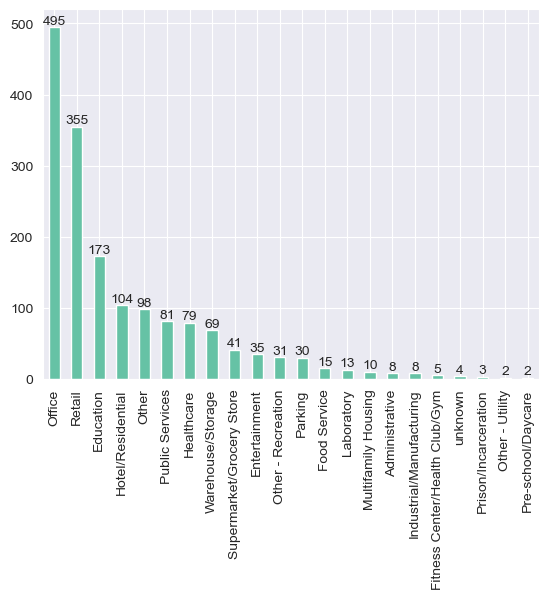

SecondLargestPropertyUseType


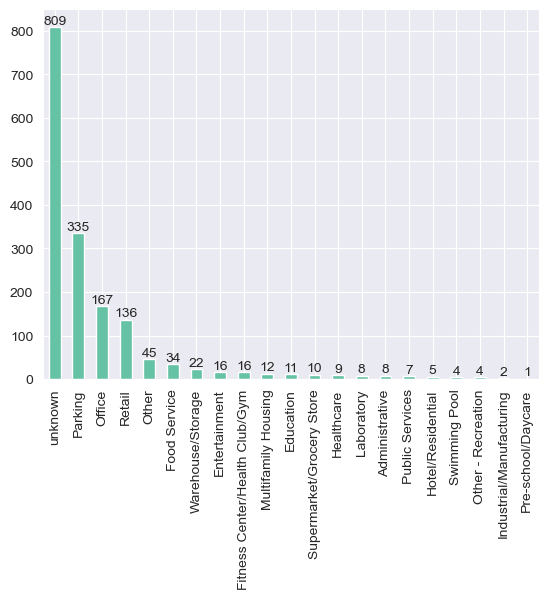

ThirdLargestPropertyUseType


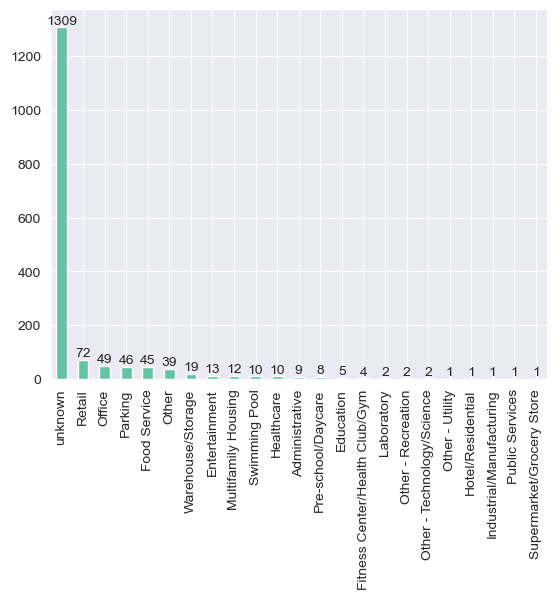

PrimaryPropertyType


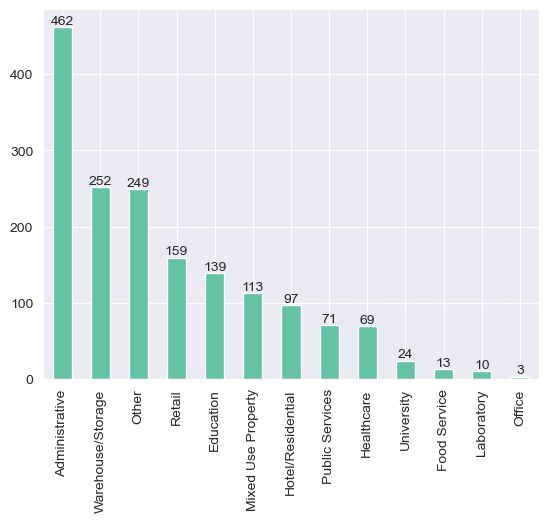

In [44]:
for col in propertytypecol:
    print(col)
    # Diagramme en secteurs
    bx=data[col].value_counts(normalize=False).plot(kind='bar')
    bx.bar_label(bx.containers[0])
    bx.set_xticklabels(bx.get_xticklabels(), rotation=90)
    plt.show()

# <a name="C3">3. Analyses Exploratoires</a>
<a href="#C0">SOMMAIRE</a>

In [45]:
#je ne prends pas en compte les outliers car j'ai un mauvais affichage sinon
data=data[data.Outlier=='no']

In [46]:
#Création d'une variable Age du bâtiment plutôt qu'année de construction
data['BuildingAge']=2016-data['YearBuilt']

C:\Users\Me\AppData\Local\Temp\ipykernel_21452\3112982825.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['BuildingAge']=2016-data['YearBuilt']


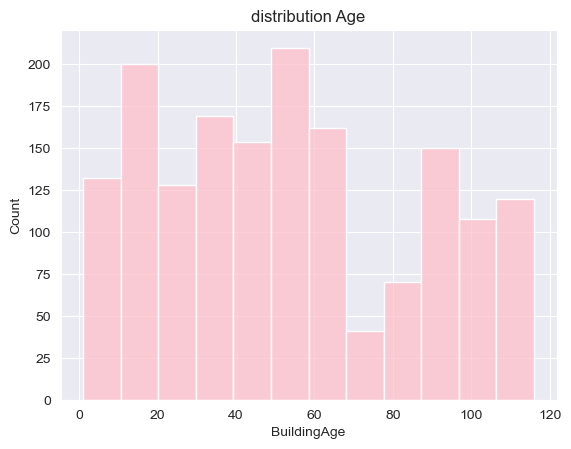

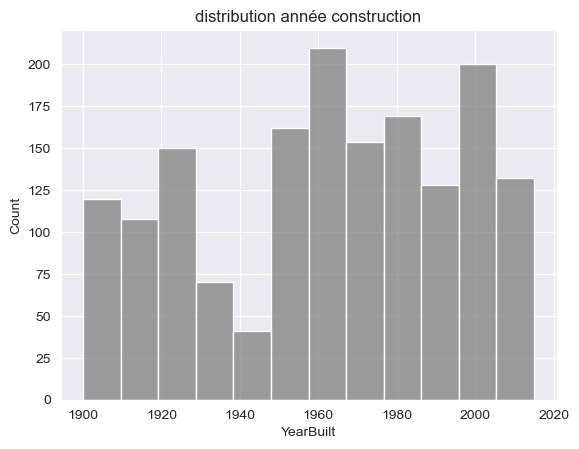

In [47]:
sns.histplot(data=data['BuildingAge'],color='pink')
plt.title('distribution Age')
plt.show()
sns.histplot(data=data['YearBuilt'],color='gray')
plt.title('distribution année construction')
plt.show()

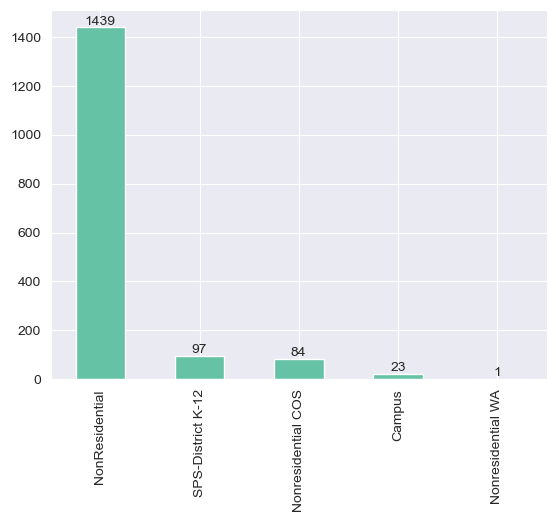

In [48]:
cx=data['BuildingType'].value_counts(normalize=False).plot(kind='bar')
cx.bar_label(cx.containers[0])
cx.set_xticklabels(cx.get_xticklabels(), rotation=90)
plt.show()
#je vais supprimer cette variable car elle ne sert pas à grand chose
#vu que quasiment tout se situe dans la première catégorie

In [49]:
#vérifions que la somme des surfaces est égale à la surface totale
(data.PropertyGFATotal-data.PropertyGFAParking-data['PropertyGFABuilding(s)']).unique()

array([0], dtype=int64)

Droite de régression PropertyGFABuilding(s) en fonction de PropertyGFATotal
y = 0.9460216394074724x + -6552.154902433547


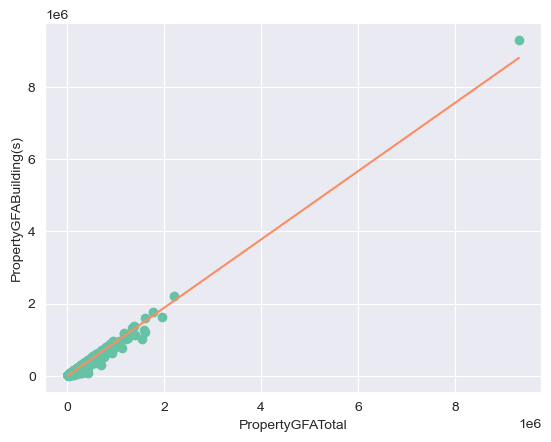

Score R2 pour le modèle : 0.9808524259796808


In [50]:
regression_lineaire(data,'PropertyGFATotal','PropertyGFABuilding(s)')

Chi-square: 7398.21
P-value: 0.00
Cramer's V: 0.87


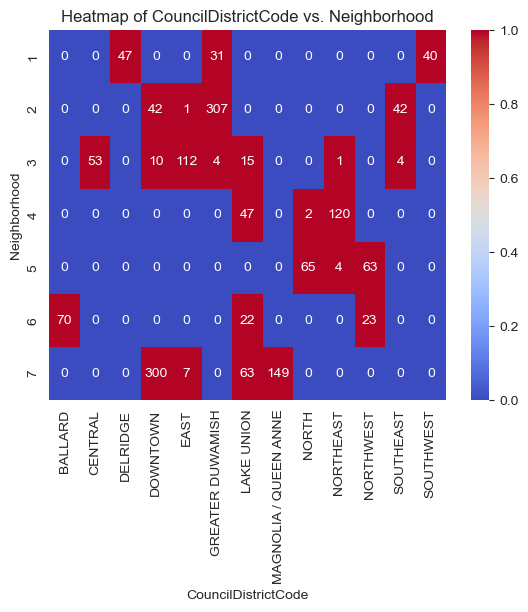

In [51]:
heatmap_analysis('CouncilDistrictCode','Neighborhood', data)

In [52]:
#on supprime une valeur vraiment déconnante pour property GFA total
data['PropertyGFATotal'].max()
data = data.drop(data[data['PropertyGFATotal'] > 9000000].index)

In [53]:
data.drop(columns=['YearBuilt','Outlier','BuildingType','CouncilDistrictCode','SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)'],inplace=True)
data
data.columns

Index(['OSEBuildingID', 'PrimaryPropertyType', 'PropertyName', 'Address',
       'Neighborhood', 'Latitude', 'Longitude', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ListOfAllPropertyUseTypes',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'ENERGYSTARScore', 'SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kBtu)', 'NaturalGas(kBtu)', 'TotalGHGEmissions',
       'GHGEmissionsIntensity', 'BuildingAge'],
      dtype='object')

In [54]:
#pour comparer ce qui est comparable j'utilise les variables d'intensité énergétique et d'intensité d'émissions
varstocompare=['SiteEUI(kBtu/sf)','GHGEmissionsIntensity']
#ce sont ici les variables à prédire
varstopredict=['TotalGHGEmissions','SiteEnergyUse(kBtu)']
#nous allons voir quelles sont les variables d'inflluence au cours de l'analyse exploratoire
varsinfluencequali=['PrimaryPropertyType','Neighborhood','LargestPropertyUseType','SecondLargestPropertyUseType','ThirdLargestPropertyUseType']
varsinfluencequanti=['Latitude','Longitude','BuildingAge','NumberofBuildings','NumberofFloors','PropertyGFATotal','PropertyGFAParking','PropertyGFABuilding(s)']

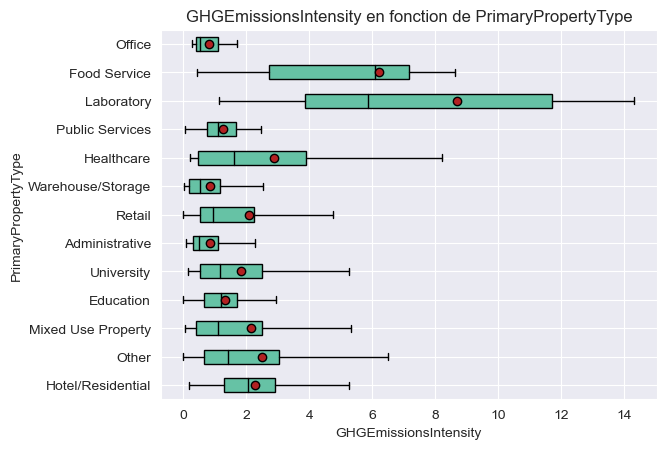

Rapport de corrélation :  0.17661190740342664 




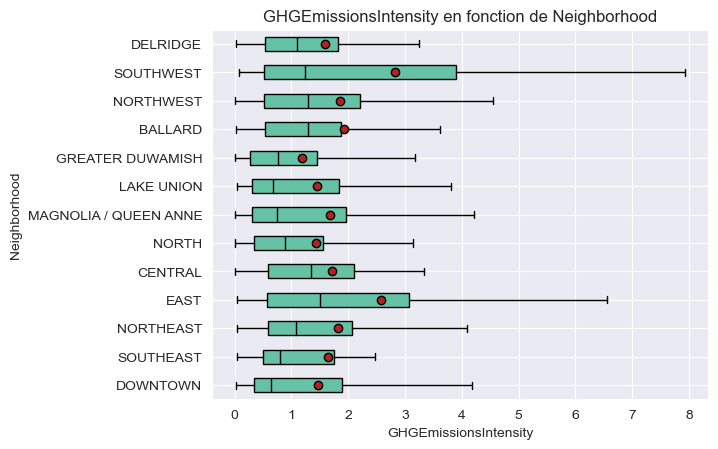

Rapport de corrélation :  0.028930932535145146 




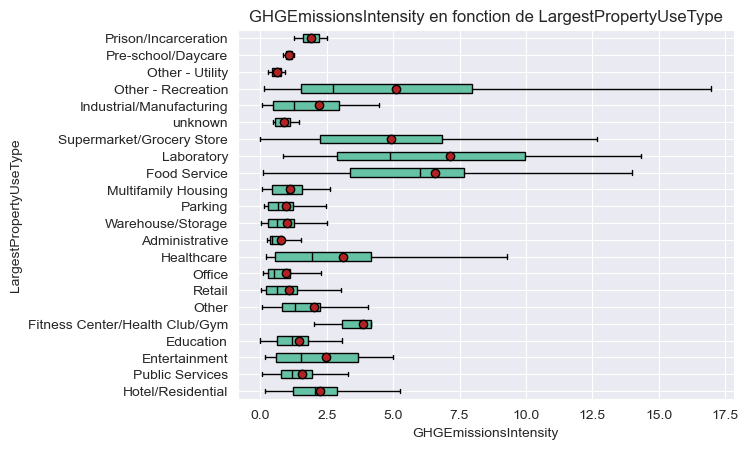

Rapport de corrélation :  0.24968159433594686 




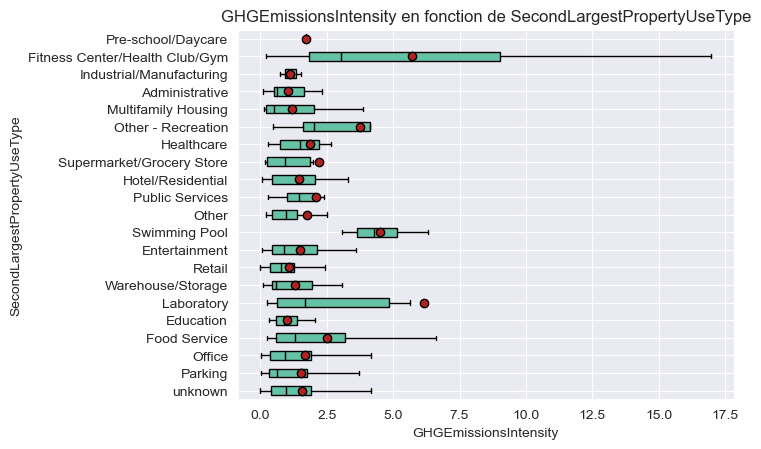

Rapport de corrélation :  0.06325826274343203 




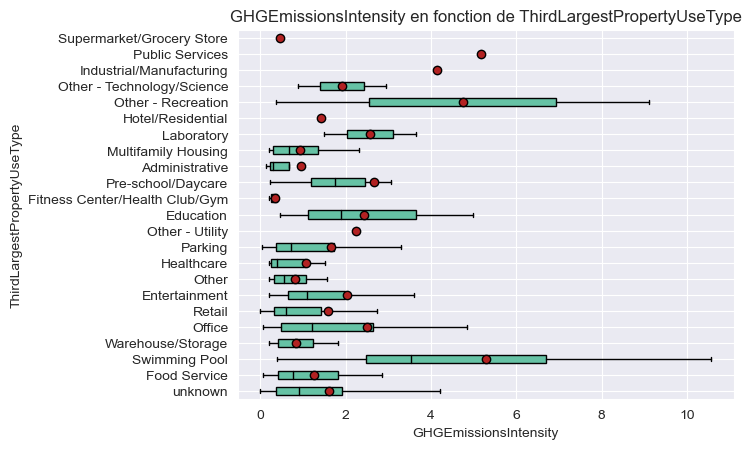

Rapport de corrélation :  0.03228530452994045 




In [55]:
# Boucle pour afficher les graphiques pour GHGEmissionsIntensity
for var in varsinfluencequali:
    anova_boxplot(data,var,'GHGEmissionsIntensity')
    print('Rapport de corrélation : ',eta_squared(data[var],data['GHGEmissionsIntensity']),'\n\n')

On s'aperçoit que concernant l'intensité d'émissions de gaz à effet de serre ce qui compte principalement c'est le primary property use et le largestproperty use, ensuite ça sert moins.

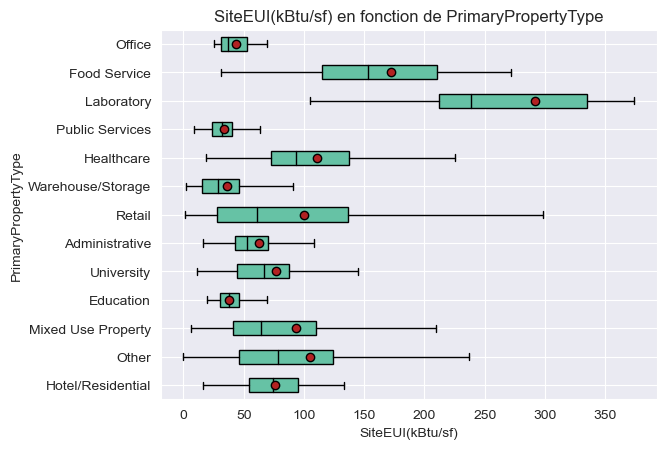

Rapport de corrélation :  0.19913284896780475 




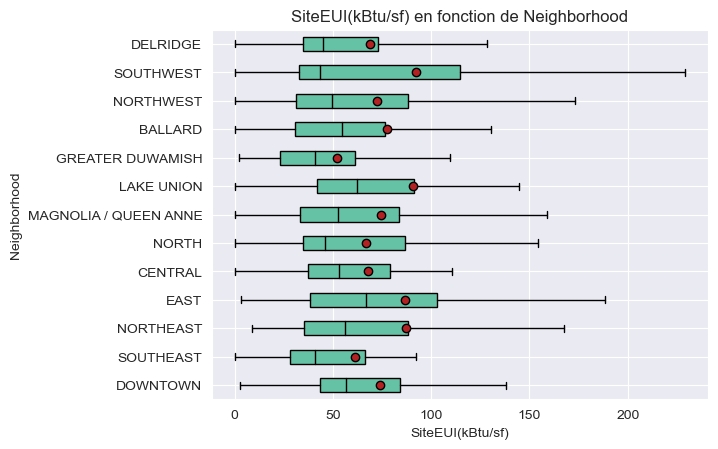

Rapport de corrélation :  0.030120619813481308 




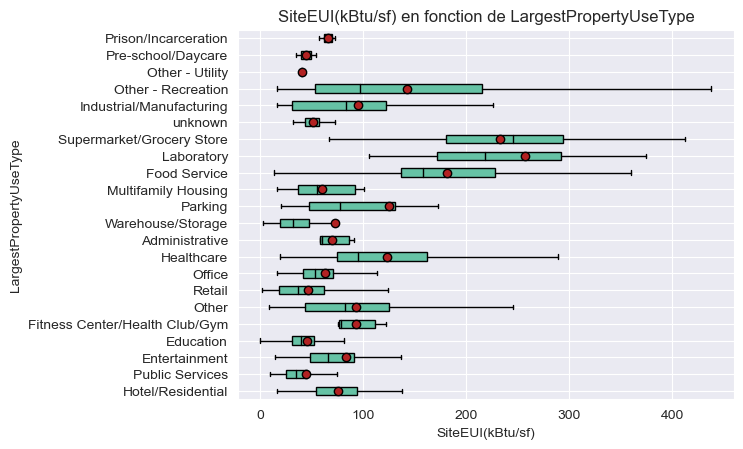

Rapport de corrélation :  0.29554382937281554 




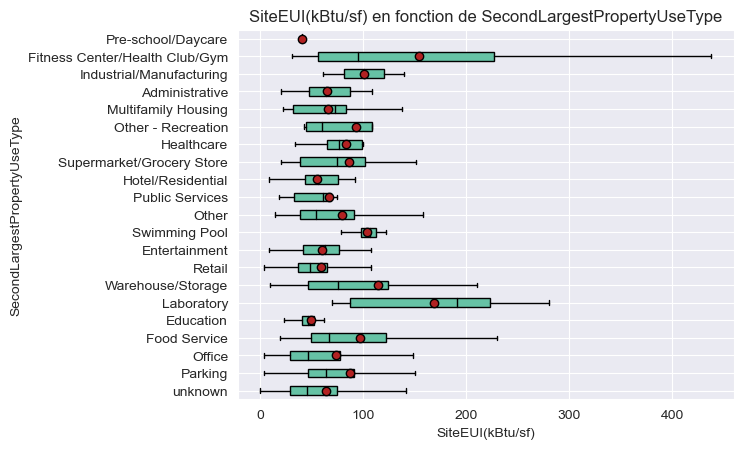

Rapport de corrélation :  0.04638707123859555 




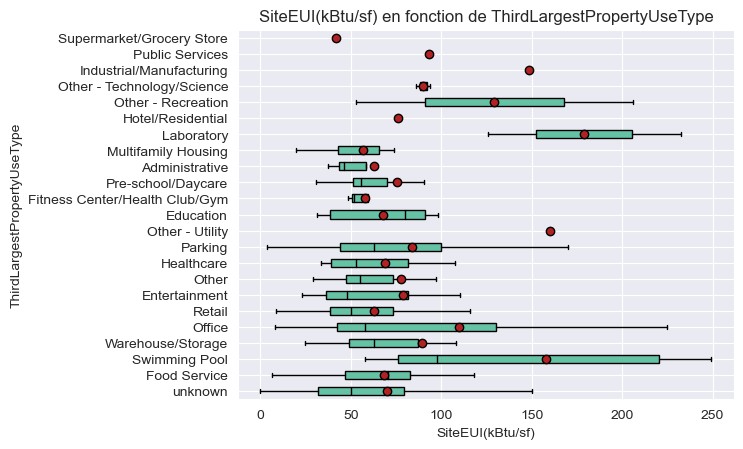

Rapport de corrélation :  0.024097587733644746 




In [56]:
# Boucle pour afficher les graphiques pour SiteEnergyUse
for var in varsinfluencequali:
    anova_boxplot(data,var,'SiteEUI(kBtu/sf)')
    print('Rapport de corrélation : ',eta_squared(data[var],data['SiteEUI(kBtu/sf)']),'\n\n')

Même conclusion sur l'intensité de consommation énergétique.

Droite de régression GHGEmissionsIntensity en fonction de Latitude
y = 1.8986438391791371x + -88.78063413020223


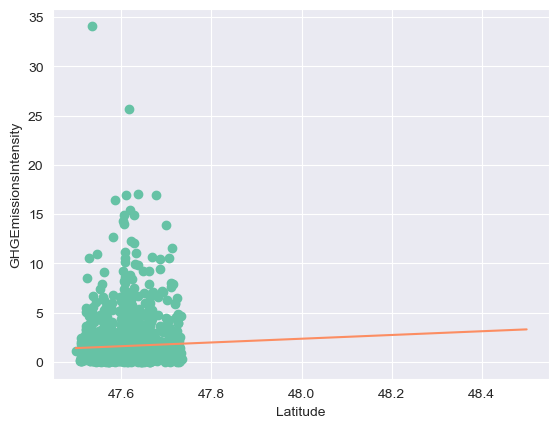

Score R2 pour le modèle : 0.0015287705578048705
Droite de régression GHGEmissionsIntensity en fonction de Longitude
y = 0.49290810619309855x + 61.924387762022036


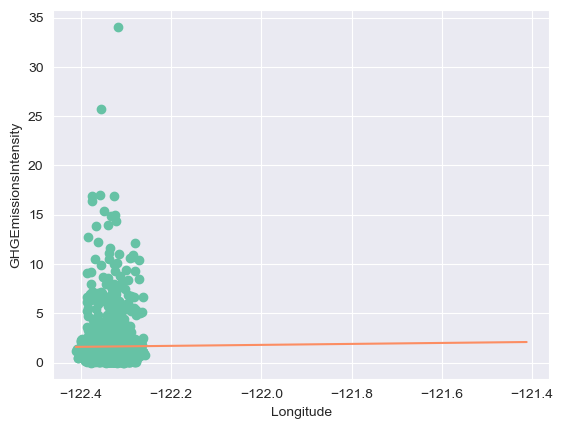

Score R2 pour le modèle : 2.67707667633843e-05
Droite de régression GHGEmissionsIntensity en fonction de BuildingAge
y = 0.001088197507110145x + 1.5669053315162222


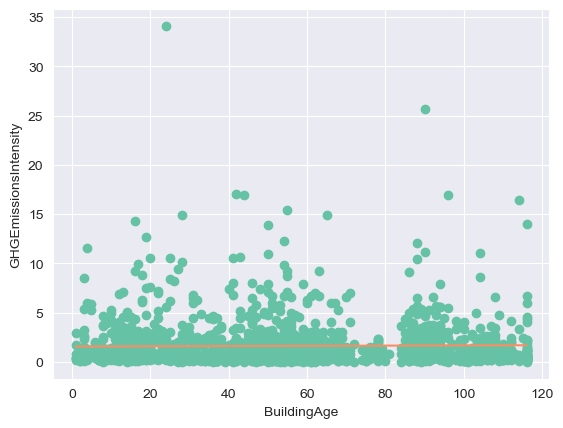

Score R2 pour le modèle : 0.0002283692655318248
Droite de régression GHGEmissionsIntensity en fonction de NumberofBuildings
y = 0.1796169413981402x + 1.4219252922195147


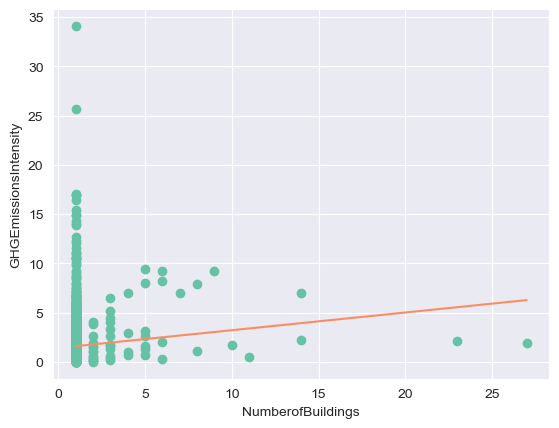

Score R2 pour le modèle : 0.007693238825759785
Droite de régression GHGEmissionsIntensity en fonction de NumberofFloors
y = -0.017763697103419695x + 1.6991226664463739


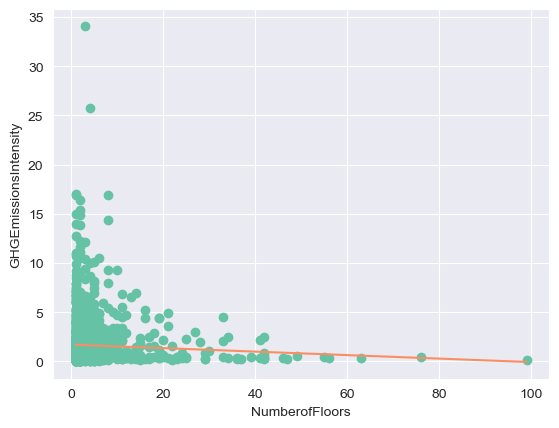

Score R2 pour le modèle : 0.002496236578220401
Droite de régression GHGEmissionsIntensity en fonction de PropertyGFATotal
y = -1.0395486954521735e-07x + 1.6372609639469955


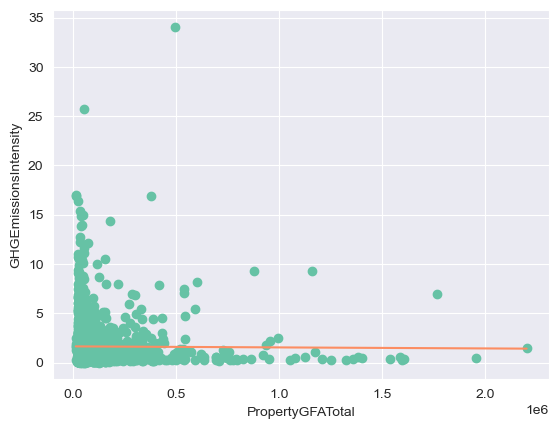

Score R2 pour le modèle : 7.275506423920497e-05
Droite de régression GHGEmissionsIntensity en fonction de PropertyGFAParking
y = -5.18985575098168e-06x + 1.6928356140839496


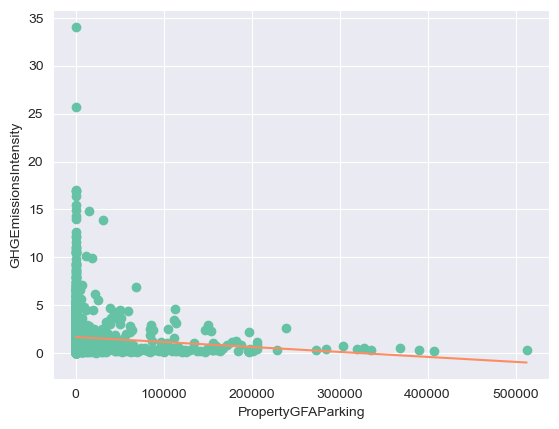

Score R2 pour le modèle : 0.008836018593257333
Droite de régression GHGEmissionsIntensity en fonction de PropertyGFABuilding(s)
y = 1.8930597569230486e-07x + 1.6064940460916741


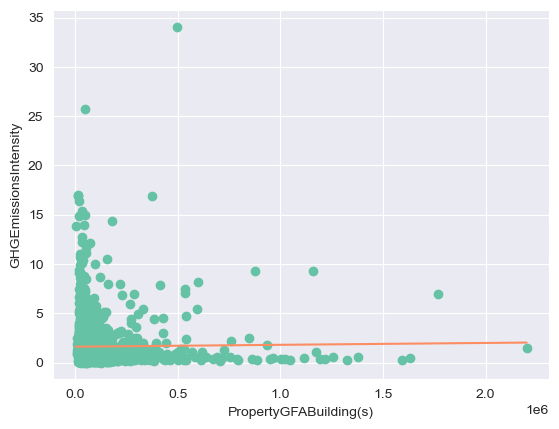

Score R2 pour le modèle : 0.00018981408946716627


In [57]:
#quantiXquanti GHG
for var in varsinfluencequanti:
    regression_lineaire(data,var,'GHGEmissionsIntensity')

Droite de régression SiteEUI(kBtu/sf) en fonction de Latitude
y = 127.00005217574132x + -5974.735029531626


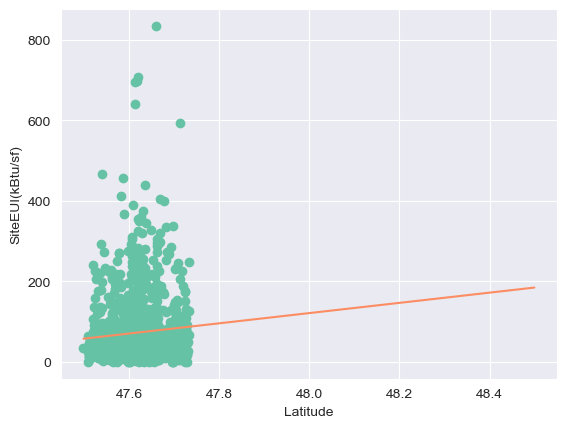

Score R2 pour le modèle : 0.006919675034457784
Droite de régression SiteEUI(kBtu/sf) en fonction de Longitude
y = -41.748979189813106x + -5034.7568332740275


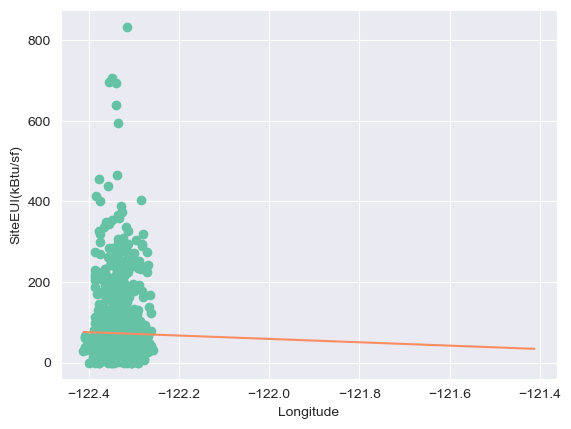

Score R2 pour le modèle : 0.00019428676209520823
Droite de régression SiteEUI(kBtu/sf) en fonction de BuildingAge
y = -0.2660012871737582x + 86.83811195722214


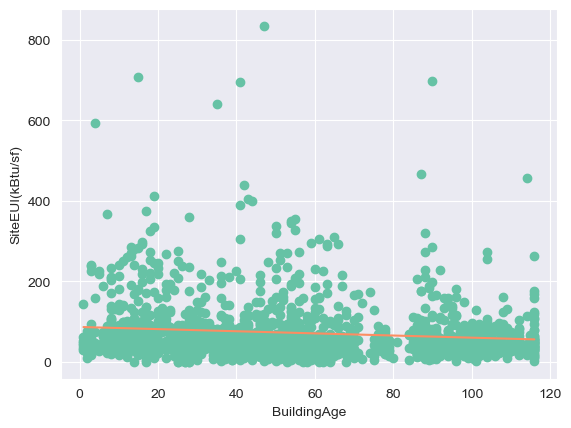

Score R2 pour le modèle : 0.013804232882563161
Droite de régression SiteEUI(kBtu/sf) en fonction de NumberofBuildings
y = 4.1073274690878545x + 67.86424610802095


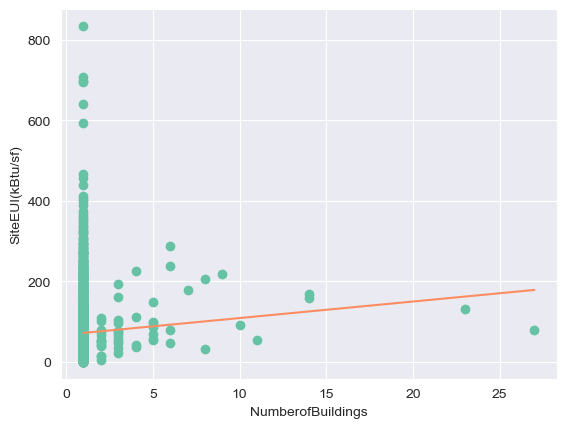

Score R2 pour le modèle : 0.004069638936684439
Droite de régression SiteEUI(kBtu/sf) en fonction de NumberofFloors
y = 0.25875037676658974x + 71.44640979109118


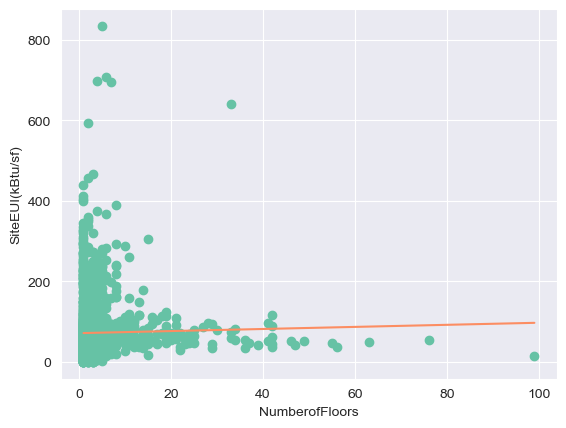

Score R2 pour le modèle : 0.000535801105390532
Droite de régression SiteEUI(kBtu/sf) en fonction de PropertyGFATotal
y = 1.6873139583243834e-05x + 70.60748516132944


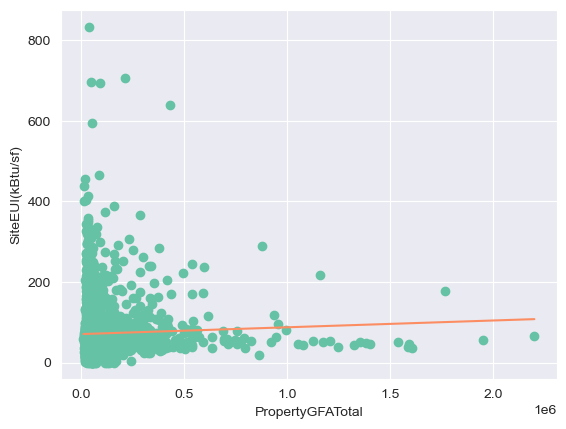

Score R2 pour le modèle : 0.0019390452800578384
Droite de régression SiteEUI(kBtu/sf) en fonction de PropertyGFAParking
y = 9.354846894143578e-05x + 71.30501829250733


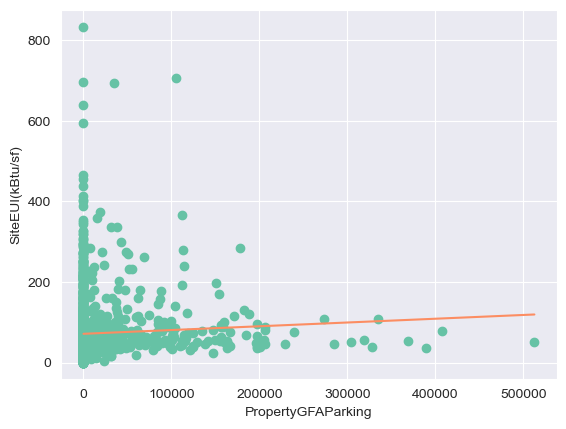

Score R2 pour le modèle : 0.0029043036072026185
Droite de régression SiteEUI(kBtu/sf) en fonction de PropertyGFABuilding(s)
y = 1.5653093895224424e-05x + 70.94884387757449


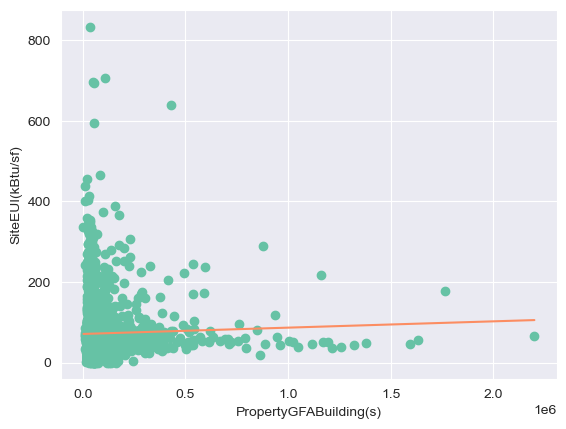

Score R2 pour le modèle : 0.001312873189057373


In [58]:
#quantiXquanti SiteEUI
for var in varsinfluencequanti:
    regression_lineaire(data,var,'SiteEUI(kBtu/sf)')

Ca ne donne pas grand chose on ne peut pas vraiment tirer de conclusion

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


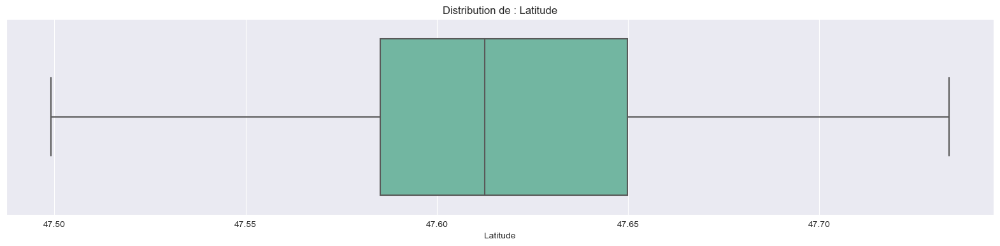

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


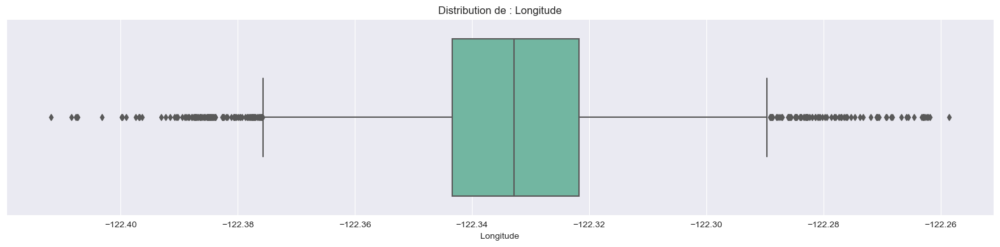

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


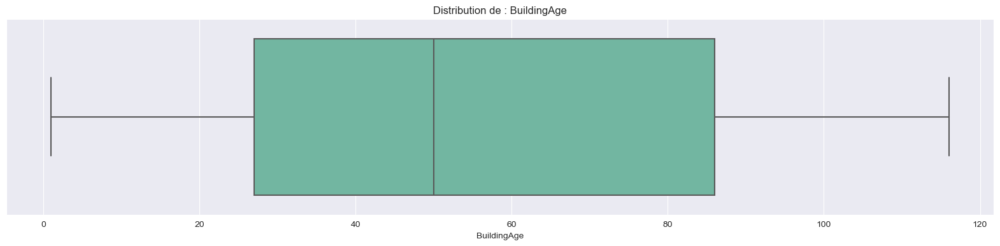

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


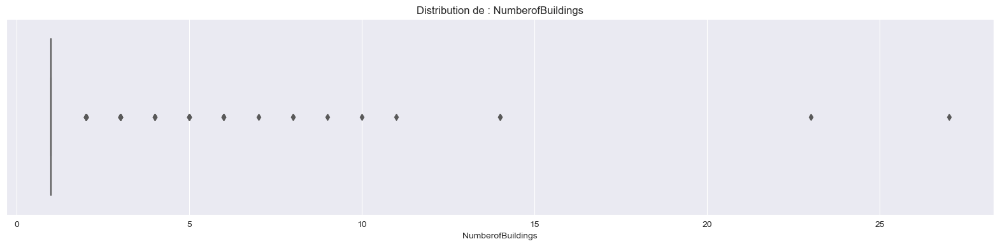

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


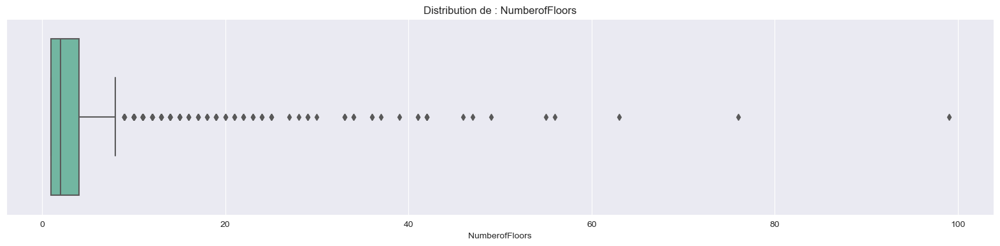

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


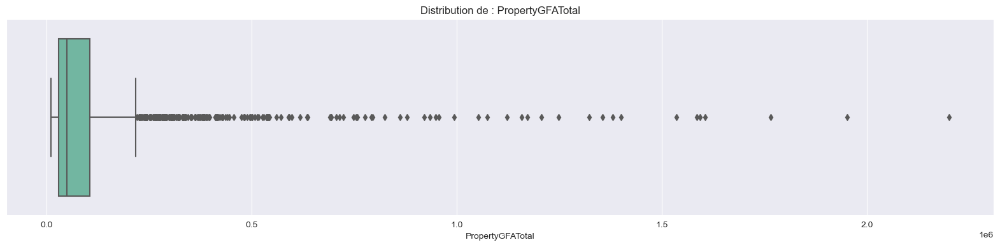

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


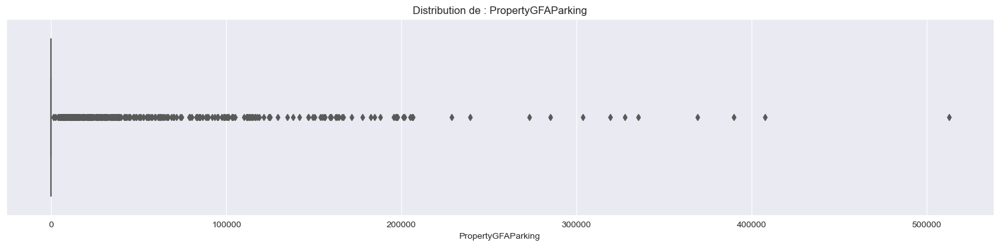

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


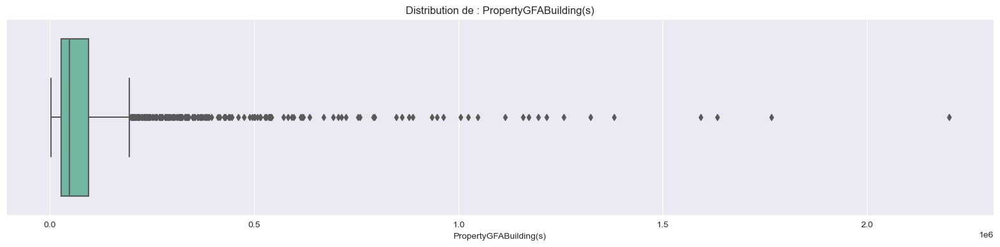

In [59]:
for var in varsinfluencequanti:
    plt.figure(figsize = (20,4))
    sns.boxplot(data[var])
    plt.title('Distribution de : '+var)
    plt.xlabel(var)
    plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


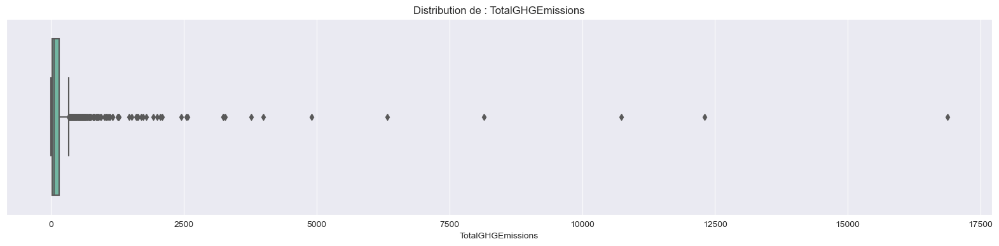

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


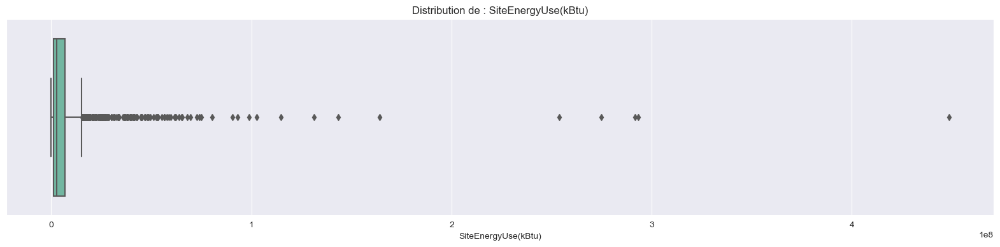

In [60]:
for var in varstopredict:
    plt.figure(figsize = (20,4))
    sns.boxplot(data[var])
    plt.title('Distribution de : '+var)
    plt.xlabel(var)
    plt.show()

In [61]:
#affichage des outliers pour totalGHGEmissions et SiteEnergyUse(kBtu)
outliers=data[(data['TotalGHGEmissions']>1000) | (data['SiteEnergyUse(kBtu)']>40000000)]
print(len(outliers))
print(len(data))
outliers

67
1643


,OSEBuildingID,PrimaryPropertyType,PropertyName,Address,Neighborhood,Latitude,Longitude,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,BuildingAge
2,3,Hotel/Residential,5673-The Westin Seattle,1900 5th Avenue,DOWNTOWN,47.613930,-122.338100,1.0,41,956110,196718,759392,Hotel,Hotel/Residential,756493.0,unknown,0.0,unknown,0.0,43.0,96.000000,97.699997,72587024.0,73937112.0,2.156655e+07,49526664.0,1493800.0,2089.28,2.19,47
19,26,Other,King County Courthouse,516 3RD AVE,DOWNTOWN,47.602650,-122.330510,1.0,10,540360,0,540360,Courthouse,Public Services,537150.0,unknown,0.0,unknown,0.0,76.0,83.699997,87.500000,44984468.0,47023088.0,0.000000e+00,24357833.0,20626631.0,1265.29,2.34,100
20,27,Other,King County Correctional Facility,500 5TH AVE,DOWNTOWN,47.603780,-122.328420,1.0,19,385274,0,385274,Other,Other,385274.0,unknown,0.0,unknown,0.0,unknown,124.199997,128.600006,47859812.0,49539212.0,0.000000e+00,18257661.0,29602150.0,1699.45,4.41,31
34,43,Mixed Use Property,Plant 2 Site,7755 E MARGINAL WAY S,GREATER DUWAMISH,47.534930,-122.317880,1.0,3,494835,0,494835,"Energy/Power Station, Laboratory, Manufacturing/Industrial Plant, Non-Refrigerated Warehouse, Office",Office,757027.0,Laboratory,639931.0,Retail,459748.0,8.0,221.699997,233.100006,448385312.0,471613856.0,0.000000e+00,150476283.0,297909000.0,16870.98,34.09,24
35,46,Warehouse/Storage,Seattle 11-13,3301 S NORFOLK ST,GREATER DUWAMISH,47.511380,-122.288750,3.0,2,714095,0,714095,"Non-Refrigerated Warehouse, Office, Refrigerated Warehouse",Retail,616000.0,Warehouse/Storage,276000.0,Office,71000.0,unknown,46.400002,45.799999,44731160.0,44110016.0,0.000000e+00,44731153.0,0.0,311.84,0.44,55
48,63,Hotel/Residential,Sheraton Seattle Hotel,1400 6th Avenue,DOWNTOWN,47.610870,-122.333390,1.0,34,994212,146694,847518,"Hotel, Parking, Swimming Pool",Hotel/Residential,994212.0,Parking,117668.0,Swimming Pool,0.0,63.0,80.900002,82.800003,80469216.0,82318072.0,1.159869e+07,45545529.0,23324992.0,2451.58,2.47,34
58,84,Healthcare,PSSA - The Mount,4831 35th Ave SW,SOUTHWEST,47.558370,-122.377510,1.0,5,217603,0,217603,"Parking, Senior Care Community",Healthcare,296313.0,Parking,0.0,unknown,0.0,54.0,144.399994,153.699997,42792072.0,45547252.0,0.000000e+00,11824772.0,30967300.0,1727.11,7.94,94
97,147,Healthcare,Swedish Ballard,5300 Tallman Ave NW,BALLARD,47.667370,-122.379560,4.0,5,285333,0,285333,"Hospital (General Medical & Surgical), Parking",Healthcare,302661.0,Parking,148865.0,unknown,0.0,14.0,225.000000,157.300003,68090728.0,47602720.0,0.000000e+00,35237205.0,32853512.0,1990.50,6.98,62
118,338,Other,Jack R. McDonald Building,1900 9th Ave.,DOWNTOWN,47.615980,-122.334480,1.0,11,299070,68432,230638,Other,Other,250000.0,unknown,0.0,unknown,0.0,unknown,261.299988,264.000000,65336980.0,66000296.0,0.000000e+00,30651644.0,34685331.0,2055.82,6.87,12
123,198,Healthcare,Seattle Children's Hospital Main Campus,4800 Sand Point Way NE,NORTHEAST,47.662310,-122.281460,6.0,10,879000,0,879000,Hospital (General Medical & Surgical),Healthcare,879000.0,unknown,0.0,unknown,0.0,10.0,288.799988,293.200012,253832464.0,257764208.0,0.000000e+00,115641210.0,138191238.0,8145.52,9.27,63


In [62]:
data.drop(index=outliers.index,inplace=True)
data.shape
data

,OSEBuildingID,PrimaryPropertyType,PropertyName,Address,Neighborhood,Latitude,Longitude,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,BuildingAge
0,1,Hotel/Residential,Mayflower park hotel,405 Olive way,DOWNTOWN,47.61220,-122.33799,1.0,12,88434,0,88434,Hotel,Hotel/Residential,88434.0,unknown,0.0,unknown,0.0,60.0,81.699997,84.300003,7.226362e+06,7.456910e+06,2003882.00,3.946027e+06,1.276453e+06,249.98,2.83,89
1,2,Hotel/Residential,Paramount Hotel,724 Pine street,DOWNTOWN,47.61317,-122.33393,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel/Residential,83880.0,Parking,15064.0,Food Service,4622.0,61.0,94.800003,97.900002,8.387933e+06,8.664479e+06,0.00,3.242851e+06,5.145082e+06,295.86,2.86,20
3,5,Hotel/Residential,HOTEL MAX,620 STEWART ST,DOWNTOWN,47.61412,-122.33664,1.0,10,61320,0,61320,Hotel,Hotel/Residential,61320.0,unknown,0.0,unknown,0.0,56.0,110.800003,113.300003,6.794584e+06,6.946800e+06,2214446.25,2.768924e+06,1.811213e+06,286.43,4.67,90
4,8,Hotel/Residential,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,DOWNTOWN,47.61375,-122.34047,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel/Residential,123445.0,Parking,68009.0,Swimming Pool,0.0,75.0,114.800003,118.699997,1.417261e+07,1.465650e+07,0.00,5.368607e+06,8.803998e+06,505.01,2.88,36
5,9,Other,West Precinct,810 Virginia St,DOWNTOWN,47.61623,-122.33657,1.0,2,97288,37198,60090,Police Station,Public Services,88830.0,unknown,0.0,unknown,0.0,unknown,136.100006,141.600006,1.208662e+07,1.258171e+07,0.00,7.371434e+06,4.715182e+06,301.81,3.10,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1663,50222,Office,Horticulture building,1600 S Dakota St,GREATER DUWAMISH,47.56722,-122.31154,1.0,1,12294,0,12294,Office,Office,12294.0,unknown,0.0,unknown,0.0,46.0,69.099998,76.699997,8.497457e+05,9.430032e+05,0.00,5.242709e+05,3.254750e+05,20.94,1.70,26
1664,50223,Other,International district/Chinatown CC,719 8th Ave S,DOWNTOWN,47.59625,-122.32283,1.0,1,16000,0,16000,Other - Recreation,Other - Recreation,16000.0,unknown,0.0,unknown,0.0,unknown,59.400002,65.900002,9.502762e+05,1.053706e+06,0.00,3.965461e+05,5.537300e+05,32.17,2.01,12
1665,50224,Other,Queen Anne Pool,1920 1st Ave W,MAGNOLIA / QUEEN ANNE,47.63644,-122.35784,1.0,1,13157,0,13157,"Fitness Center/Health Club/Gym, Other - Recreation, Swimming Pool",Other - Recreation,7583.0,Fitness Center/Health Club/Gym,5574.0,Swimming Pool,0.0,unknown,438.200012,460.100006,5.765898e+06,6.053764e+06,0.00,1.792159e+06,3.973739e+06,223.54,16.99,42
1666,50225,Mixed Use Property,South Park Community Center,8319 8th Ave S,GREATER DUWAMISH,47.52832,-122.32431,1.0,1,14101,0,14101,"Fitness Center/Health Club/Gym, Food Service, Office, Other - Recreation, Pre-school/Daycare",Other - Recreation,6601.0,Fitness Center/Health Club/Gym,6501.0,Pre-school/Daycare,484.0,unknown,51.000000,55.500000,7.194712e+05,7.828413e+05,0.00,3.488702e+05,3.706010e+05,22.11,1.57,27


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


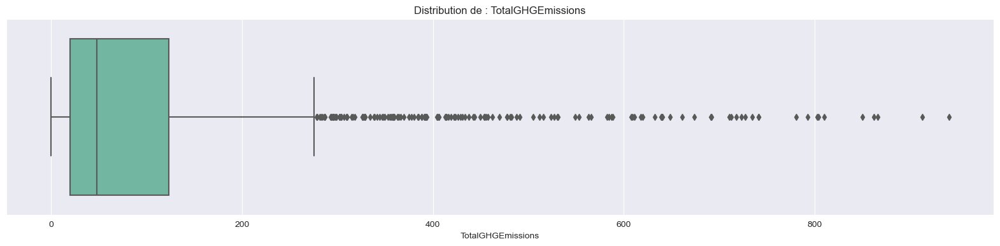

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


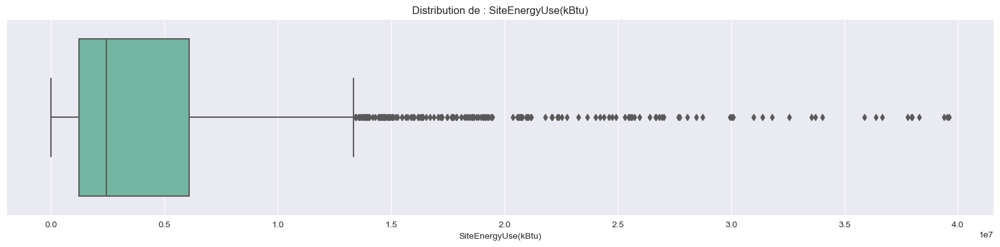

In [63]:
for var in varstopredict:
    plt.figure(figsize = (20,4))
    sns.boxplot(data[var])
    plt.title('Distribution de : '+var)
    plt.xlabel(var)
    plt.show()

In [64]:
#for var in ['TotalGHGEmissions','SiteEnergyUse(kBtu)'] :
import folium
from branca.colormap import LinearColormap
var='TotalGHGEmissions'
print(var)
# Créer une carte
map_osm = folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()],zoom_start=11)

# Créer une colormap rouge-vert inversée
cmap = LinearColormap(colors=['green', 'yellow', 'red'], index=[data[var].min(), 
                                                                data[var].median(), 
                                                                data[var].quantile(0.75)],
                      vmin=data[var].min(), vmax=data[var].quantile(0.95), 
                      caption=var)

# Ajouter des cercles avec des couleurs correspondantes à l'intensité de consommation énergétique
for i in range(0,len(data)):
    folium.CircleMarker([data.iloc[i]['Latitude'],data.iloc[i]['Longitude']], 
                      popup=data.iloc[i][var], 
                      radius =5, 
                      fill=True,
                      fill_opacity=1,
                      color=cmap(data.iloc[i][var])).add_to(map_osm)

# Ajouter la légende
map_osm.add_child(cmap)

# Afficher la carte
map_osm




TotalGHGEmissions


In [65]:
var='SiteEnergyUse(kBtu)'
print(var)
# Créer une carte
map_osm = folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()],zoom_start=11)

# Créer une colormap rouge-vert inversée
cmap = LinearColormap(colors=['green', 'yellow', 'red'], index=[data[var].min(), 
                                                                data[var].median(), 
                                                                data[var].quantile(0.75)],
                      vmin=data[var].min(), vmax=data[var].quantile(0.90), 
                      caption=var)

# Ajouter des cercles avec des couleurs correspondantes à l'intensité de consommation énergétique
for i in range(0,len(data)):
    folium.CircleMarker([data.iloc[i]['Latitude'],data.iloc[i]['Longitude']], 
                      popup=data.iloc[i][var], 
                      radius =5, 
                      fill=True,
                      fill_opacity=1,
                      color=cmap(data.iloc[i][var])).add_to(map_osm)

# Ajouter la légende
map_osm.add_child(cmap)

# Afficher la carte
map_osm

SiteEnergyUse(kBtu)


In [66]:
var='NumberofFloors'
print(var)
# Créer une carte
map_osm = folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()],zoom_start=11)

# Créer une colormap rouge-vert inversée
cmap = LinearColormap(colors=['white','blue','yellow'], index=[data[var].min(), 
                                                                data[var].quantile(0.80),data[var].quantile(0.99)],
                      vmin=data[var].min(), vmax=data[var].quantile(0.995), 
                      caption=var)

# Ajouter des cercles avec des couleurs correspondantes à l'intensité de consommation énergétique
for i in range(0,len(data)):
    folium.CircleMarker([data.iloc[i]['Latitude'],data.iloc[i]['Longitude']], 
                      popup=data.iloc[i][var], 
                      radius =5, 
                      fill=True,
                      fill_opacity=1,
                      color=cmap(data.iloc[i][var])).add_to(map_osm)

# Ajouter la légende
map_osm.add_child(cmap)

# Afficher la carte
map_osm

NumberofFloors


In [67]:
var='PropertyGFATotal'

import folium

def get_circle_radius(value):
    """
    Maps a value to a circle radius using a custom scaling factor.
    """
    # Define the scaling factor (adjust as needed)
    scale_factor = 0.0001
    # Compute the circle radius as the value times the scaling factor
    radius = value * scale_factor
    # Cap the radius at a maximum value (adjust as needed)
    max_radius = 10
    radius = min(radius, max_radius)
    return radius

# Créer une carte
map_osm = folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()], zoom_start=11)

# Créer une colormap rouge-vert inversée
cmap = LinearColormap(colors=['white', 'magenta'],
                      index=[data[var].min(),data[var].quantile(0.95)],
                      vmin=data[var].min(), vmax=data[var].quantile(0.95), caption=var)

# Ajouter des cercles avec des couleurs correspondantes à l'intensité de consommation énergétique
for i in range(0, len(data)):
    folium.CircleMarker(location=[data.iloc[i]['Latitude'], data.iloc[i]['Longitude']],
                        popup=data.iloc[i][var],
                        radius=get_circle_radius(data.iloc[i][var]),
                        fill=True,
                        fill_opacity=1,
                        color=cmap(data.iloc[i][var])).add_to(map_osm)

# Ajouter la légende
map_osm.add_child(cmap)


# Afficher la carte
map_osm


C:\Users\Me\AppData\Local\Temp\ipykernel_21452\1760036631.py:3: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr, dtype=np.bool)


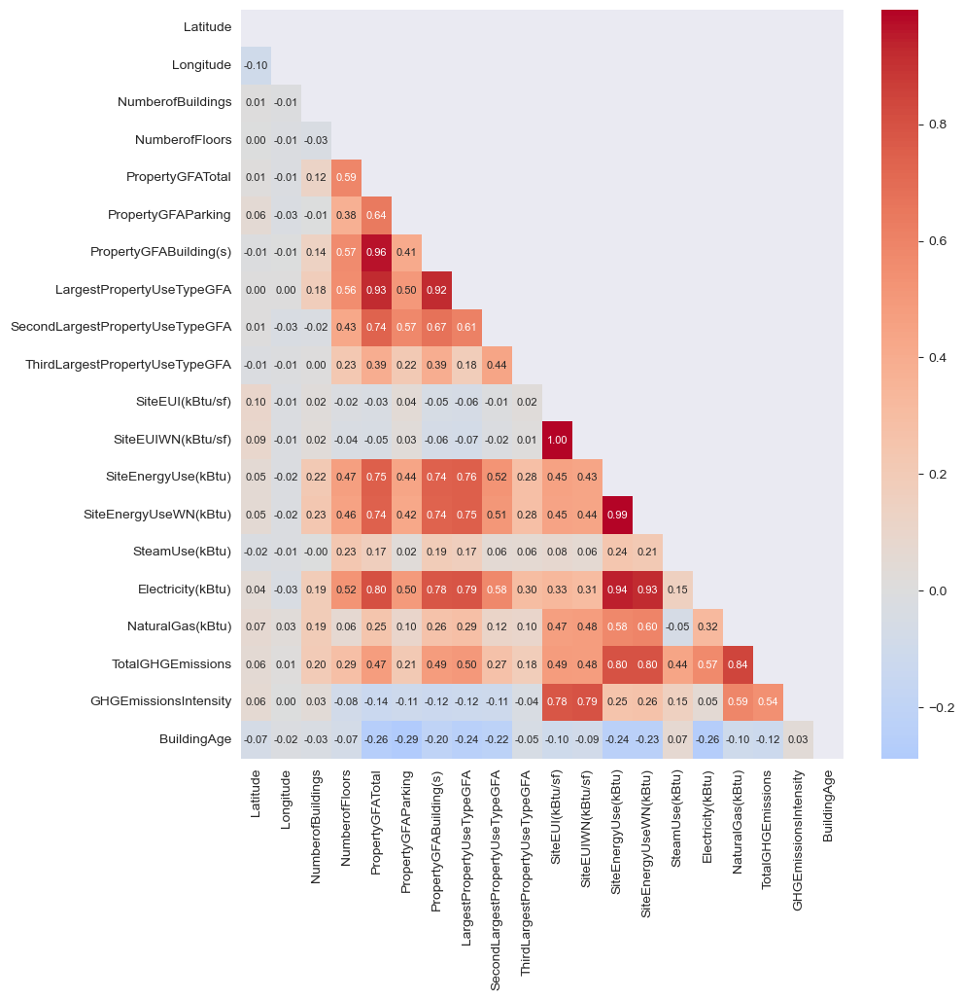

In [68]:
fig, cx = plt.subplots(figsize=(10,10))
corr=data.drop(columns='OSEBuildingID').corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True 
cx=sns.heatmap(corr, annot=True, fmt=".2f", mask=mask, annot_kws={'size':8}, center=0, cmap="coolwarm")


In [69]:
corr_pairs = data.corr().unstack().sort_values()
strong_corr = (pd.DataFrame(corr_pairs[(abs(corr_pairs) > 0.8)])
               .reset_index().rename(columns={0:'coeff_corr'}))
strong_corr = strong_corr[(strong_corr.index%2 == 0) & 
                          (strong_corr['level_0'] != strong_corr['level_1'])]
strong_corr

,level_0,level_1,coeff_corr
0,Electricity(kBtu),PropertyGFATotal,0.800769
2,NaturalGas(kBtu),TotalGHGEmissions,0.841423
4,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,0.922774
6,PropertyGFATotal,LargestPropertyUseTypeGFA,0.925588
8,Electricity(kBtu),SiteEnergyUseWN(kBtu),0.925962
10,Electricity(kBtu),SiteEnergyUse(kBtu),0.943086
12,PropertyGFABuilding(s),PropertyGFATotal,0.963822
14,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),0.988213
16,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),0.996487


<AxesSubplot:xlabel='SiteEnergyUse(kBtu)', ylabel='Count'>

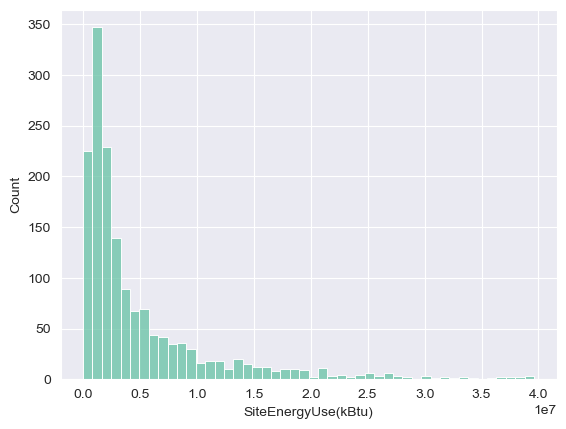

In [70]:
sns.histplot(data['SiteEnergyUse(kBtu)'])

In [71]:
rowstodrop=data[data['SiteEnergyUse(kBtu)']==0]
print(len(rowstodrop))
rowstodrop

15


,OSEBuildingID,PrimaryPropertyType,PropertyName,Address,Neighborhood,Latitude,Longitude,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,BuildingAge
27,34,Education,Meany Building,301/300 21st Ave. E.,CENTRAL,47.62266,-122.30547,1.0,1,126351,0,126351,K-12 School,Education,126351.0,unknown,0.0,unknown,0.0,unknown,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,61
30,37,Education,John Hay Elementary,201 Garfield St.,MAGNOLIA / QUEEN ANNE,47.63290,-122.35172,1.0,2,51582,0,51582,K-12 School,Education,55166.0,unknown,0.0,unknown,0.0,unknown,0.0,0.0,0.0,0.0,0.0,1496816.0,0.0,10.43,0.20,27
61,87,Education,Arbor Heights Elementary,3701 S.W. 104th St.,SOUTHWEST,47.50970,-122.37759,1.0,2,53352,0,53352,K-12 School,Education,65568.0,unknown,0.0,unknown,0.0,unknown,0.0,0.0,0.0,0.0,0.0,600813.0,0.0,4.19,0.08,68
80,118,Education,Pathfinder K-8,1901 SW Genesee St.,DELRIDGE,47.56360,-122.35800,1.0,3,74468,0,74468,K-12 School,Education,75364.0,unknown,0.0,unknown,0.0,unknown,0.0,0.0,0.0,0.0,0.0,1698176.0,0.0,11.84,0.16,17
84,122,Education,John Muir Elementary,3301 S. Horton St.,SOUTHEAST,47.57324,-122.29058,1.0,2,58933,0,58933,K-12 School,Education,60725.0,unknown,0.0,unknown,0.0,unknown,0.0,0.0,0.0,0.0,0.0,2347138.0,0.0,16.36,0.28,25
94,140,Education,B.F. Day Elementary,3921 Linden Ave. N.,LAKE UNION,47.65464,-122.34912,1.0,3,66588,0,66588,K-12 School,Education,66588.0,unknown,0.0,unknown,0.0,unknown,0.0,0.0,0.0,0.0,0.0,2104286.0,0.0,14.67,0.22,25
132,217,Education,Whitman Middle,9201 15th Ave. NW.,BALLARD,47.69675,-122.37760,1.0,1,160270,0,160270,K-12 School,Education,160270.0,unknown,0.0,unknown,0.0,unknown,0.0,0.0,0.0,0.0,0.0,0.0,4318917.0,229.38,1.43,57
138,227,Education,Washington Middle,2101 S. Jackson,CENTRAL,47.59796,-122.30415,1.0,3,136188,0,136188,K-12 School,Education,136188.0,unknown,0.0,unknown,0.0,unknown,0.0,0.0,0.0,0.0,0.0,0.0,3217877.0,170.90,1.25,53
151,242,Education,Olympic View Elementary,504 N.E. 95th St.,NORTH,47.69823,-122.32126,1.0,2,52792,0,52792,K-12 School,Education,55480.0,unknown,0.0,unknown,0.0,unknown,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,27
604,820,Education,Bailey Gatzert Elementary,1301 E. Yesler Way,CENTRAL,47.60120,-122.31548,1.0,1,52924,0,52924,K-12 School,Education,52924.0,unknown,0.0,unknown,0.0,unknown,0.0,0.0,0.0,0.0,0.0,1957268.0,0.0,13.64,0.26,28


In [72]:
print(len(data))
data.drop(index=rowstodrop.index,inplace=True)
print(len(data))

1576
1561


# <a name="C4">4. Feature Engineering</a>
<a href="#C0">SOMMAIRE</a>

In [73]:
data['ElectricityUse']= data['Electricity(kBtu)'].apply(lambda x: 0 if x == 0 else 1)
data['SteamUse']= data['SteamUse(kBtu)'].apply(lambda x: 0 if x == 0 else 1)
data['NaturalGasUse']= data['NaturalGas(kBtu)'].apply(lambda x: 0 if x == 0 else 1)
data['NbEnergies']=data['ElectricityUse']+data['SteamUse']+data['NaturalGasUse']

In [74]:
data.columns

Index(['OSEBuildingID', 'PrimaryPropertyType', 'PropertyName', 'Address',
       'Neighborhood', 'Latitude', 'Longitude', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ListOfAllPropertyUseTypes',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'ENERGYSTARScore', 'SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kBtu)', 'NaturalGas(kBtu)', 'TotalGHGEmissions',
       'GHGEmissionsIntensity', 'BuildingAge', 'ElectricityUse', 'SteamUse',
       'NaturalGasUse', 'NbEnergies'],
      dtype='object')

In [75]:
coltodrop=['PropertyName','Address','Neighborhood','ListOfAllPropertyUseTypes','SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)', 
           'GHGEmissionsIntensity','SiteEnergyUseWN(kBtu)','SteamUse(kBtu)','Electricity(kBtu)', 'NaturalGas(kBtu)']
data.drop(columns=coltodrop,inplace=True)
data.columns

Index(['OSEBuildingID', 'PrimaryPropertyType', 'Latitude', 'Longitude',
       'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'ENERGYSTARScore', 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions',
       'BuildingAge', 'ElectricityUse', 'SteamUse', 'NaturalGasUse',
       'NbEnergies'],
      dtype='object')

In [76]:
#OSEBuildingID set as index
data.set_index('OSEBuildingID',inplace=True)

In [77]:
#Rename Columns without parenthesis
data.rename(columns={'PropertyGFABuilding(s)':'PropertyGFABuilding_s','SiteEnergyUse(kBtu)':'SiteEnergyUse_kBtu'},inplace=True)

In [78]:
#selectcolumns for dummies
dummiesdata=data.select_dtypes(include=['object','category']).drop(columns='ENERGYSTARScore')
#map dummies
dummies = pd.get_dummies(dummiesdata)
dummies

,PrimaryPropertyType_Administrative,PrimaryPropertyType_Education,PrimaryPropertyType_Food Service,PrimaryPropertyType_Healthcare,PrimaryPropertyType_Hotel/Residential,PrimaryPropertyType_Laboratory,PrimaryPropertyType_Mixed Use Property,PrimaryPropertyType_Office,PrimaryPropertyType_Other,PrimaryPropertyType_Public Services,PrimaryPropertyType_Retail,PrimaryPropertyType_University,PrimaryPropertyType_Warehouse/Storage,LargestPropertyUseType_Administrative,LargestPropertyUseType_Education,LargestPropertyUseType_Entertainment,LargestPropertyUseType_Fitness Center/Health Club/Gym,LargestPropertyUseType_Food Service,LargestPropertyUseType_Healthcare,LargestPropertyUseType_Hotel/Residential,LargestPropertyUseType_Industrial/Manufacturing,LargestPropertyUseType_Laboratory,LargestPropertyUseType_Multifamily Housing,LargestPropertyUseType_Office,LargestPropertyUseType_Other,LargestPropertyUseType_Other - Recreation,LargestPropertyUseType_Other - Utility,LargestPropertyUseType_Parking,LargestPropertyUseType_Pre-school/Daycare,LargestPropertyUseType_Prison/Incarceration,LargestPropertyUseType_Public Services,LargestPropertyUseType_Retail,LargestPropertyUseType_Supermarket/Grocery Store,LargestPropertyUseType_Warehouse/Storage,LargestPropertyUseType_unknown,SecondLargestPropertyUseType_Administrative,SecondLargestPropertyUseType_Education,SecondLargestPropertyUseType_Entertainment,SecondLargestPropertyUseType_Fitness Center/Health Club/Gym,SecondLargestPropertyUseType_Food Service,SecondLargestPropertyUseType_Healthcare,SecondLargestPropertyUseType_Hotel/Residential,SecondLargestPropertyUseType_Industrial/Manufacturing,SecondLargestPropertyUseType_Laboratory,SecondLargestPropertyUseType_Multifamily Housing,SecondLargestPropertyUseType_Office,SecondLargestPropertyUseType_Other,SecondLargestPropertyUseType_Other - Recreation,SecondLargestPropertyUseType_Parking,SecondLargestPropertyUseType_Pre-school/Daycare,SecondLargestPropertyUseType_Public Services,SecondLargestPropertyUseType_Retail,SecondLargestPropertyUseType_Supermarket/Grocery Store,SecondLargestPropertyUseType_Swimming Pool,SecondLargestPropertyUseType_Warehouse/Storage,SecondLargestPropertyUseType_unknown,ThirdLargestPropertyUseType_Administrative,ThirdLargestPropertyUseType_Education,ThirdLargestPropertyUseType_Entertainment,ThirdLargestPropertyUseType_Fitness Center/Health Club/Gym,ThirdLargestPropertyUseType_Food Service,ThirdLargestPropertyUseType_Healthcare,ThirdLargestPropertyUseType_Hotel/Residential,ThirdLargestPropertyUseType_Industrial/Manufacturing,ThirdLargestPropertyUseType_Laboratory,ThirdLargestPropertyUseType_Multifamily Housing,ThirdLargestPropertyUseType_Office,ThirdLargestPropertyUseType_Other,ThirdLargestPropertyUseType_Other - Recreation,ThirdLargestPropertyUseType_Other - Technology/Science,ThirdLargestPropertyUseType_Parking,ThirdLargestPropertyUseType_Pre-school/Daycare,ThirdLargestPropertyUseType_Public Services,ThirdLargestPropertyUseType_Retail,ThirdLargestPropertyUseType_Supermarket/Grocery Store,ThirdLargestPropertyUseType_Swimming Pool,ThirdLargestPropertyUseType_Warehouse/Storage,ThirdLargestPropertyUseType_unknown
OSEBuildingID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
9,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,

In [79]:
colstodrop=data.select_dtypes(include=['object','category']).drop(columns='ENERGYSTARScore').columns

#dataframe à exporter pour la modélisation
df=data.drop(columns=colstodrop).join(dummies)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1561 entries, 1 to 50226
Data columns (total 96 columns):
 #   Column                                                       Non-Null Count  Dtype  
---  ------                                                       --------------  -----  
 0   Latitude                                                     1561 non-null   float64
 1   Longitude                                                    1561 non-null   float64
 2   NumberofBuildings                                            1561 non-null   float64
 3   NumberofFloors                                               1561 non-null   int64  
 4   PropertyGFATotal                                             1561 non-null   int64  
 5   PropertyGFAParking                                           1561 non-null   int64  
 6   PropertyGFABuilding_s                                        1561 non-null   int64  
 7   LargestPropertyUseTypeGFA                                    1561 non-null   

In [80]:
#save dataframe for modelization
df.to_csv('datapostcleaning.csv')

## Deuxième test de feature engineering en créant un pourcentage de la surface totale pour chaque catégorie pour avoir moins de variables

In [81]:
df2=data

In [82]:
df2[['PropertyGFAParking','PropertyGFABuilding_s']]

,PropertyGFAParking,PropertyGFABuilding_s
OSEBuildingID,,
1,0,88434
2,15064,88502
5,0,61320
8,62000,113580
9,37198,60090
...,...,...
50222,0,12294
50223,0,16000
50224,0,13157


In [83]:
df2['GFAParking_perc']=df2.PropertyGFAParking/df2.PropertyGFATotal
df2.drop(columns=['PropertyGFAParking','PropertyGFABuilding_s'],inplace=True)

In [84]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1561 entries, 1 to 50226
Data columns (total 21 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   PrimaryPropertyType              1561 non-null   object 
 1   Latitude                         1561 non-null   float64
 2   Longitude                        1561 non-null   float64
 3   NumberofBuildings                1561 non-null   float64
 4   NumberofFloors                   1561 non-null   int64  
 5   PropertyGFATotal                 1561 non-null   int64  
 6   LargestPropertyUseType           1561 non-null   object 
 7   LargestPropertyUseTypeGFA        1561 non-null   float64
 8   SecondLargestPropertyUseType     1561 non-null   object 
 9   SecondLargestPropertyUseTypeGFA  1561 non-null   float64
 10  ThirdLargestPropertyUseType      1561 non-null   object 
 11  ThirdLargestPropertyUseTypeGFA   1561 non-null   float64
 12  ENERGYSTARScore    

In [85]:
#colonnes de use type 
# extraire les colonnes contenant les informations sur les types de propriété d'utilisation et leur surface
type_cols = ['LargestPropertyUseType', 'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType']
gfa_cols = ['LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseTypeGFA']

# df pour stocker les valeurs 
new_df = pd.DataFrame()

# créer une liste de tous les types de propriété d'utilisation différents
all_types = set()
for col in type_cols:
    all_types.update(df2[col].unique())

# créer des nouvelles colonnes pour chaque type de propriété d'utilisation différent
for t in all_types:
    col_name = t.replace(' ', '') + '_s'
    new_df[col_name] = 0.0



In [86]:
new_df

,Other-Technology/Science_s,Office_s,Other-Utility_s,FoodService_s,Administrative_s,Other_s,unknown_s,Entertainment_s,Pre-school/Daycare_s,Other-Recreation_s,Prison/Incarceration_s,Healthcare_s,Parking_s,FitnessCenter/HealthClub/Gym_s,Industrial/Manufacturing_s,Laboratory_s,SwimmingPool_s,Hotel/Residential_s,PublicServices_s,MultifamilyHousing_s,Retail_s,Supermarket/GroceryStore_s,Education_s,Warehouse/Storage_s


In [87]:
# remplir les nouvelles colonnes pour chaque bâtiment / ligne avec le pourcentage de surface pour chaque type de propriété d'utilisation
for i, row in df2.iterrows():
    total_gfa = row['PropertyGFATotal']
    for j, t in enumerate(type_cols):
        type_val = row[t]
        if pd.notnull(type_val):
            gfa_val = row[gfa_cols[j]]
            percentage = gfa_val / total_gfa
            col_name = type_val.replace(' ', '')+ '_s'
            new_df.at[i, col_name] = gfa_val


In [88]:
new_df.describe()

,Other-Technology/Science_s,Office_s,Other-Utility_s,FoodService_s,Administrative_s,Other_s,unknown_s,Entertainment_s,Pre-school/Daycare_s,Other-Recreation_s,Prison/Incarceration_s,Healthcare_s,Parking_s,FitnessCenter/HealthClub/Gym_s,Industrial/Manufacturing_s,Laboratory_s,SwimmingPool_s,Hotel/Residential_s,PublicServices_s,MultifamilyHousing_s,Retail_s,Supermarket/GroceryStore_s,Education_s,Warehouse/Storage_s
count,2.000000,675.000000,2.00000,88.000000,22.000000,165.000000,1241.0,55.000000,11.000000,36.000000,3.000000,82.000000,369.000000,25.000000,11.000000,14.000000,12.0,102.000000,86.000000,33.000000,506.000000,52.000000,166.000000,99.000000
mean,7770.500000,70675.694222,83474.50000,10305.000000,15260.681818,43916.787879,0.0,35665.600000,9437.545455,39444.972222,11646.000000,78539.730469,45312.465574,16212.280000,31413.272727,51180.714286,0.0,88820.362745,32409.453488,44966.939394,40831.097629,41305.250000,77192.307229,35794.696970
std,2155.968576,110052.707953,77962.05816,10357.634214,18287.863794,66158.284023,0.0,53979.607573,16472.208652,91825.073370,343.166141,98910.413464,64896.670439,19757.571786,38506.628918,45870.460018,0.0,76912.701650,18537.789919,79370.565131,55857.417565,27212.564438,86436.819876,34538.600117
min,6246.000000,187.000000,28347.00000,436.000000,3027.000000,300.000000,0.0,1000.000000,400.000000,4323.000000,11285.000000,1025.000000,0.000000,1670.000000,5581.000000,5000.000000,0.0,5000.000000,3650.000000,1248.000000,0.000000,2000.000000,1665.000000,182.000000
25%,7008.250000,13660.500000,55910.75000,3662.250000,5952.000000,8634.000000,0.0,9718.500000,625.000000,11033.500000,11485.000000,22836.000000,3312.000000,7501.000000,12078.000000,22868.500000,0.0,34028.500000,21939.000000,10060.000000,10980.500000,25930.250000,31168.750000,11748.000000
50%,7770.500000,29720.000000,83474.50000,6379.500000,7380.000000,22200.000000,0.0,20411.000000,1364.000000,19362.500000,11685.000000,44874.500000,18590.000000,8508.000000,22800.000000,36029.500000,0.0,64951.000000,26379.500000,18130.000000,23738.500000,38682.000000,51688.000000,26532.000000
75%,8532.750000,78618.000000,111038.25000,13177.250000,18745.750000,44775.000000,0.0,37603.000000,6667.500000,30871.250000,11826.500000,95345.500000,66430.000000,14081.000000,25384.500000,65470.000000,0.0,111761.250000,40068.500000,40878.000000,45404.500000,48906.250000,75204.000000,46797.500000
max,9295.000000,983697.000000,138602.00000,50000.000000,87552.000000,380639.000000,0.0,333698.000000,44162.000000,564258.000000,11968.000000,726000.000000,432903.000000,90000.000000,142901.000000,176171.000000,0.0,348630.000000,103000.000000,340236.000000,509342.000000,168735.000000,667335.000000,162425.000000


In [90]:
# remplacer les NaN par des zéros
new_df = new_df.fillna(0)

df2 = df2.join(new_df)
df2

,PrimaryPropertyType,Latitude,Longitude,NumberofBuildings,NumberofFloors,PropertyGFATotal,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUse_kBtu,TotalGHGEmissions,BuildingAge,ElectricityUse,SteamUse,NaturalGasUse,NbEnergies,GFAParking_perc,Other-Technology/Science_s,Office_s,Other-Utility_s,FoodService_s,Administrative_s,Other_s,unknown_s,Entertainment_s,Pre-school/Daycare_s,Other-Recreation_s,Prison/Incarceration_s,Healthcare_s,Parking_s,FitnessCenter/HealthClub/Gym_s,Industrial/Manufacturing_s,Laboratory_s,SwimmingPool_s,Hotel/Residential_s,PublicServices_s,MultifamilyHousing_s,Retail_s,Supermarket/GroceryStore_s,Education_s,Warehouse/Storage_s
OSEBuildingID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Hotel/Residential,47.61220,-122.33799,1.0,12,88434,Hotel/Residential,88434.0,unknown,0.0,unknown,0.0,60.0,7.226362e+06,249.98,89,1,1,1,3,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,88434.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Hotel/Residential,47.61317,-122.33393,1.0,11,103566,Hotel/Residential,83880.0,Parking,15064.0,Food Service,4622.0,61.0,8.387933e+06,295.86,20,1,0,1,2,0.145453,0.0,0.0,0.0,4622.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15064.0,0.0,0.0,0.0,0.0,83880.0,0.0,0.0,0.0,0.0,0.0,0.0
5,Hotel/Residential,47.61412,-122.33664,1.0,10,61320,Hotel/Residential,61320.0,unknown,0.0,unknown,0.0,56.0,6.794584e+06,286.43,90,1,1,1,3,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,61320.0,0.0,0.0,0.0,0.0,0.0,0.0
8,Hotel/Residential,47.61375,-122.34047,1.0,18,175580,Hotel/Residential,123445.0,Parking,68009.0,Swimming Pool,0.0,75.0,1.417261e+07,505.01,36,1,0,1,2,0.353115,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,68009.0,0.0,0.0,0.0,0.0,123445.0,0.0,0.0,0.0,0.0,0.0,0.0
9,Other,47.61623,-122.33657,1.0,2,97288,Public Services,88830.0,unknown,0.0,unknown,0.0,unknown,1.208662e+07,301.81,17,1,0,1,2,0.382349,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,88830.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50222,Office,47.56722,-122.31154,1.0,1,12294,Office,12294.0,unknown,0.0,unknown,0.0,46.0,8.497457e+05,20.94,26,1,0,1,2,0.000000,0.0,12294.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50223,Other,47.59625,-122.32283,1.0,1,16000,Other - Recreation,16000.0,unknown,0.0,unknown,0.0,unknown,9.502762e+05,32.17,12,1,0,1,2,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50224,Other,47.63644,-122.35784,1.0,1,13157,Other - Recreation,7583.0,Fitness Center/Health Club/Gym,5574.0,Swimming Pool,0.0,unknown,5.765898e+06,223.54,42,1,0,1,2,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7583.0,0.0,0.0,0.0,5574.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [92]:
df2.drop(columns=type_cols+gfa_cols,inplace=True)
df2.drop(columns='NbEnergies',inplace=True)
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1561 entries, 1 to 50226
Data columns (total 38 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   PrimaryPropertyType             1561 non-null   object 
 1   Latitude                        1561 non-null   float64
 2   Longitude                       1561 non-null   float64
 3   NumberofBuildings               1561 non-null   float64
 4   NumberofFloors                  1561 non-null   int64  
 5   PropertyGFATotal                1561 non-null   int64  
 6   ENERGYSTARScore                 1561 non-null   object 
 7   SiteEnergyUse_kBtu              1561 non-null   float64
 8   TotalGHGEmissions               1561 non-null   float64
 9   BuildingAge                     1561 non-null   int64  
 10  ElectricityUse                  1561 non-null   int64  
 11  SteamUse                        1561 non-null   int64  
 12  NaturalGasUse                   1

In [93]:
#map dummies
dum = pd.get_dummies(df2['PrimaryPropertyType'])
df2 = df2.join(dum)
df2.drop(columns='PrimaryPropertyType',inplace=True)

In [94]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1561 entries, 1 to 50226
Data columns (total 50 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Latitude                        1561 non-null   float64
 1   Longitude                       1561 non-null   float64
 2   NumberofBuildings               1561 non-null   float64
 3   NumberofFloors                  1561 non-null   int64  
 4   PropertyGFATotal                1561 non-null   int64  
 5   ENERGYSTARScore                 1561 non-null   object 
 6   SiteEnergyUse_kBtu              1561 non-null   float64
 7   TotalGHGEmissions               1561 non-null   float64
 8   BuildingAge                     1561 non-null   int64  
 9   ElectricityUse                  1561 non-null   int64  
 10  SteamUse                        1561 non-null   int64  
 11  NaturalGasUse                   1561 non-null   int64  
 12  GFAParking_perc                 1

In [95]:
#save dataframe for modelization
df2.to_csv('datapostcleaning2.csv')

<AxesSubplot:xlabel='SiteEnergyUse_kBtu', ylabel='Count'>

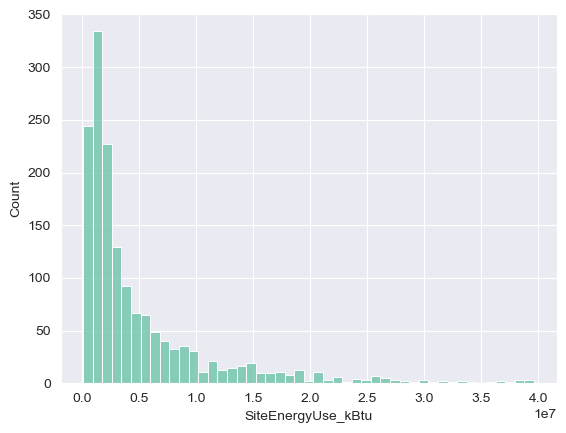

In [100]:
sns.histplot(data['SiteEnergyUse_kBtu'])

<AxesSubplot:xlabel='TotalGHGEmissions', ylabel='Count'>

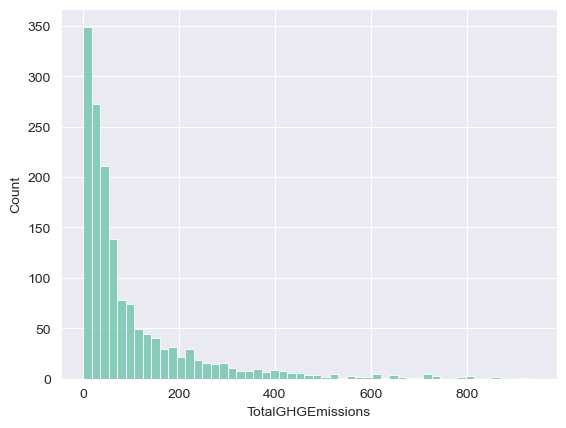

In [101]:
sns.histplot(data['TotalGHGEmissions'])

([<matplotlib.patches.Wedge at 0x297d7559550>,
 [Text(-1.0811985450292436, 0.20250853371314223, 'no'),
  Text(1.081198533179106, -0.20250859698133777, 'yes')])

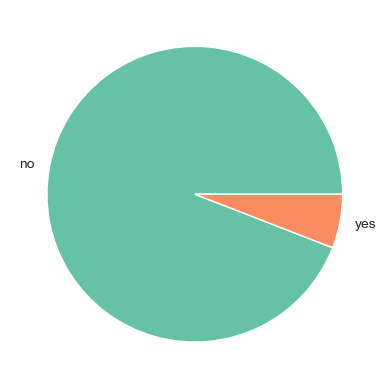

In [115]:
plt.pie(data.SteamUse.value_counts(),labels=['no','yes'])

<AxesSubplot:xlabel='NaturalGasUse', ylabel='Count'>

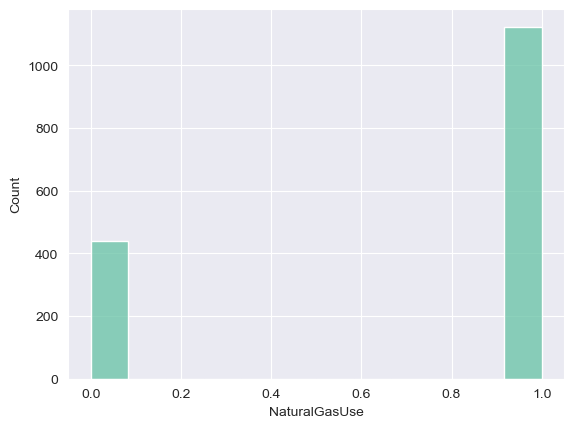

In [116]:
sns.histplot(data['NaturalGasUse'])

([<matplotlib.patches.Wedge at 0x297d7651d60>,
 [Text(-0.6995959450399227, 0.8488613041502703, 'yes'),
  Text(0.699596024516051, -0.8488612386493667, 'no')])

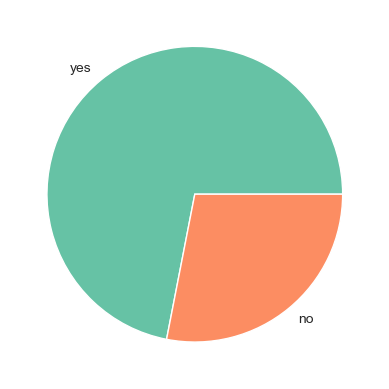

In [118]:
plt.pie(data.NaturalGasUse.value_counts(),labels=['yes','no'])